# Spotify Churn EDA

This notebook performs exploratory data analysis (EDA) on two datasets:

1. `spotify_churn_dataset.csv` (original Spotify churn dataset)
2. `spotify_churn_32000.csv` (32K sampled/augmented Spotify churn dataset)

This IPYNB conducts EDA using three methods
1. Basic EDA -- general statistical analysis and minimal charting
2. Automated EDA usign Profile Report -- Interactive Graphs to discover new relationships
3. Advanced EDA -- Using isnights from Basic EDA & Automated EDA to build out more complex relationships to analyze


In [9]:
!pip install ydata-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.6/90.6 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.2/91.2 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 398.7/398.7 kB 14.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.9/134.9 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 40.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.7/679.7 kB 37.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 463.6/463.6 kB 27.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 52.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 47.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 2.5 MB/s eta 0:00:00
  Attempting uninstall: pydantic-core
    Fou

In [1]:
from ydata_profiling import ProfileReport

In [2]:
import pandas as pd
import numpy as np

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

In [3]:
regular_path = 'spotify_churn_dataset.csv'
big_path = 'spotify_churn_32000.csv'

In [4]:
def run_basic_eda(df: pd.DataFrame, name: str):
    """for doing basic EDA steps.

    steps:
    - show shape and first few rows
    - show info (dtypes, non-null counts)
    - show descriptive statistics (numeric + categorical)
    - check missing values
    - check duplicate rows
    """
    print(f"\n==============================")
    print(f"EDA for: {name}")
    print(f"==============================\n")

    # shape
    print("Shape (rows, columns):", df.shape)

    # few rows
    display(df.head())

    # info = dtypes + non-null counts
    print("\nDataFrame info:")
    print(df.info())

    # descriptive stats for numeric and categorical
    print("\nDescriptive statistics (numeric):")
    display(df.describe(include=[np.number]).T)

    print("\nDescriptive statistics (categorical):")
    display(df.describe(include=['object', 'category']).T)

    # are there missing values?
    print("\nMissing values per column:")
    print(df.isna().sum().sort_values(ascending=False))

    # duplicates
    print("\nNumber of duplicate rows:", df.duplicated().sum())

## Basic EDA & ProfileReport on Original Spotify Churn Dataset (`spotify_churn_dataset.csv`)
- 8000 rows
- 12 impact features

In [5]:
# load org dataset
spotify_regular = pd.read_csv(regular_path)

# run above func on this org. dataset
run_basic_eda(spotify_regular, 'Original Spotify Churn Dataset')


EDA for: Original Spotify Churn Dataset

Shape (rows, columns): (8000, 12)


,user_id,gender,age,country,subscription_type,listening_time,songs_played_per_day,skip_rate,device_type,ads_listened_per_week,offline_listening,is_churned
0,1,Female,54,CA,Free,26,23,0.20,Desktop,31,0,1
1,2,Other,33,DE,Family,141,62,0.34,Web,0,1,0
2,3,Male,38,AU,Premium,199,38,0.04,Mobile,0,1,1
3,4,Female,22,CA,Student,36,2,0.31,Mobile,0,1,0
4,5,Other,29,US,Family,250,57,0.36,Mobile,0,1,1



DataFrame info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8000 entries, 0 to 7999
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   user_id                8000 non-null   int64  
 1   gender                 8000 non-null   object 
 2   age                    8000 non-null   int64  
 3   country                8000 non-null   object 
 4   subscription_type      8000 non-null   object 
 5   listening_time         8000 non-null   int64  
 6   songs_played_per_day   8000 non-null   int64  
 7   skip_rate              8000 non-null   float64
 8   device_type            8000 non-null   object 
 9   ads_listened_per_week  8000 non-null   int64  
 10  offline_listening      8000 non-null   int64  
 11  is_churned             8000 non-null   int64  
dtypes: float64(1), int64(7), object(4)
memory usage: 750.1+ KB
None

Descriptive statistics (numeric):


,count,mean,std,min,25%,50%,75%,max
user_id,8000.0,4000.500000,2309.545410,1.0,2000.75,4000.5,6000.25,8000.0
age,8000.0,37.662125,12.740359,16.0,26.00,38.0,49.00,59.0
listening_time,8000.0,154.068250,84.015596,10.0,81.00,154.0,227.00,299.0
songs_played_per_day,8000.0,50.127250,28.449762,1.0,25.00,50.0,75.00,99.0
skip_rate,8000.0,0.300127,0.173594,0.0,0.15,0.3,0.45,0.6
ads_listened_per_week,8000.0,6.943875,13.617953,0.0,0.00,0.0,5.00,49.0
offline_listening,8000.0,0.747750,0.434331,0.0,0.00,1.0,1.00,1.0
is_churned,8000.0,0.258875,0.438044,0.0,0.00,0.0,1.00,1.0



Descriptive statistics (categorical):


,count,unique,top,freq
gender,8000,3,Male,2691
country,8000,8,AU,1034
subscription_type,8000,4,Premium,2115
device_type,8000,3,Desktop,2778



Missing values per column:
user_id                  0
gender                   0
age                      0
country                  0
subscription_type        0
listening_time           0
songs_played_per_day     0
skip_rate                0
device_type              0
ads_listened_per_week    0
offline_listening        0
is_churned               0
dtype: int64

Number of duplicate rows: 0


In [6]:
# automated EDA report using ProfileReport on the original dataset
profile_regular = ProfileReport(spotify_regular, title="Original Spotify Churn EDA")
profile_regular.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 12/12 [00:00<00:00, 41.62it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Numeric columns: ['user_id', 'age', 'listening_time', 'songs_played_per_day', 'skip_rate', 'ads_listened_per_week', 'offline_listening', 'is_churned']


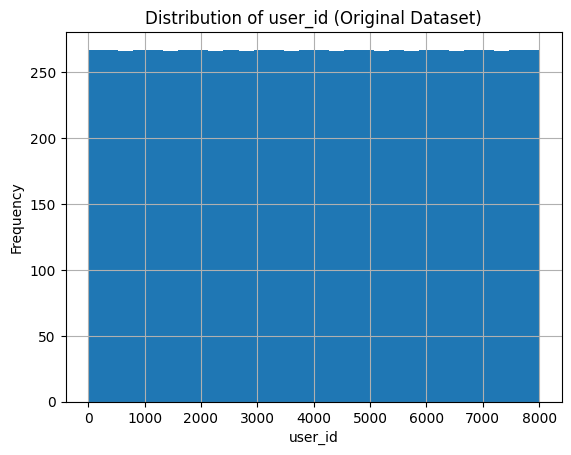

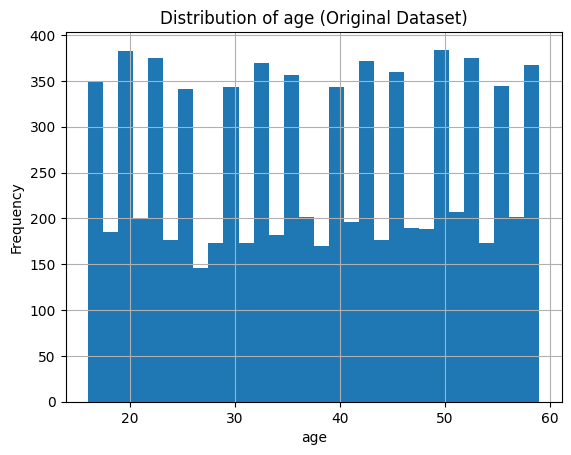

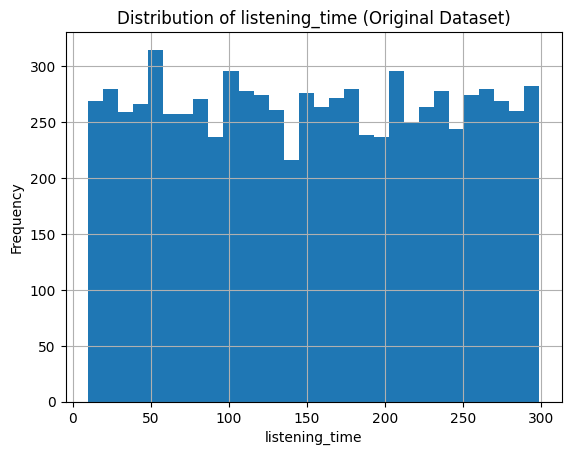

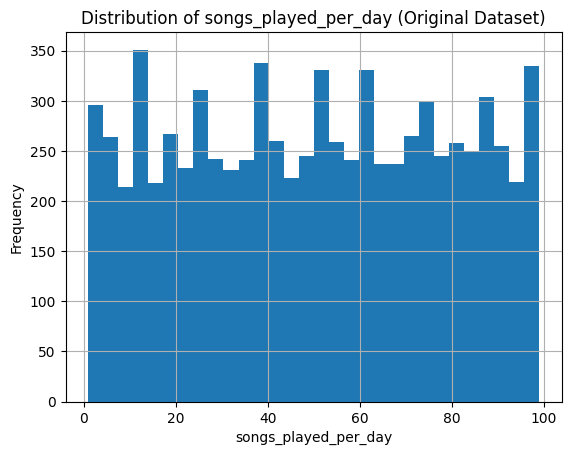

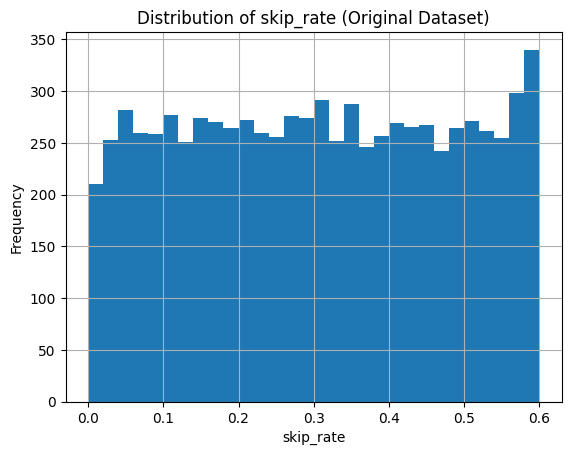

In [7]:
import matplotlib.pyplot as plt

# just testing out histograms on a few different features
numeric_cols = spotify_regular.select_dtypes(include=[np.number]).columns.tolist()
print('Numeric columns:', numeric_cols)

# limit to first 5 numeric columns
for col in numeric_cols[:5]:
    plt.figure()
    spotify_regular[col].hist(bins=30)
    plt.title(f'Distribution of {col} (Original Dataset)')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

## Basic EDA & Profile Report on 32K Spotify Churn Dataset (`spotify_churn_32000.csv`)

In [8]:
# load 32k spotify data
spotify_32k = pd.read_csv(big_path)

# basic EDA following the same steps
run_basic_eda(spotify_32k, '32K Spotify Churn Dataset')


EDA for: 32K Spotify Churn Dataset

Shape (rows, columns): (32000, 12)


,user_id,gender,age,country,subscription_type,listening_time,songs_played_per_day,skip_rate,device_type,ads_listened_per_week,offline_listening,is_churned
0,8001,Male,66,IN,Premium,84,54,0.174894,Desktop,0,0,0
1,8002,Male,56,US,Family,1,23,0.099244,Desktop,0,0,0
2,8003,Other,26,FR,Student,1,44,0.195300,Desktop,0,0,0
3,8004,Other,59,FR,Premium,37,31,0.301560,Desktop,0,0,0
4,8005,Other,21,AU,Family,102,30,0.501183,Web,0,0,1



DataFrame info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32000 entries, 0 to 31999
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   user_id                32000 non-null  int64  
 1   gender                 32000 non-null  object 
 2   age                    32000 non-null  int64  
 3   country                32000 non-null  object 
 4   subscription_type      32000 non-null  object 
 5   listening_time         32000 non-null  int64  
 6   songs_played_per_day   32000 non-null  int64  
 7   skip_rate              32000 non-null  float64
 8   device_type            32000 non-null  object 
 9   ads_listened_per_week  32000 non-null  int64  
 10  offline_listening      32000 non-null  int64  
 11  is_churned             32000 non-null  int64  
dtypes: float64(1), int64(7), object(4)
memory usage: 2.9+ MB
None

Descriptive statistics (numeric):


,count,mean,std,min,25%,50%,75%,max
user_id,32000.0,24000.500000,9237.748643,8001.000000,16000.750000,24000.500000,32000.250000,40000.000000
age,32000.0,42.497813,15.585032,16.000000,29.000000,42.000000,56.000000,69.000000
listening_time,32000.0,119.987156,58.720602,1.000000,79.000000,119.000000,160.000000,431.000000
songs_played_per_day,32000.0,39.730688,19.512997,1.000000,26.000000,40.000000,53.000000,110.000000
skip_rate,32000.0,0.286690,0.159836,0.001055,0.162177,0.265745,0.389797,0.948151
ads_listened_per_week,32000.0,1.566344,3.126784,0.000000,0.000000,0.000000,2.000000,48.000000
offline_listening,32000.0,0.301844,0.459065,0.000000,0.000000,0.000000,1.000000,1.000000
is_churned,32000.0,0.271125,0.444547,0.000000,0.000000,0.000000,1.000000,1.000000



Descriptive statistics (categorical):


,count,unique,top,freq
gender,32000,3,Other,10776
country,32000,8,UK,4072
subscription_type,32000,4,Free,8118
device_type,32000,3,Mobile,10707



Missing values per column:
user_id                  0
gender                   0
age                      0
country                  0
subscription_type        0
listening_time           0
songs_played_per_day     0
skip_rate                0
device_type              0
ads_listened_per_week    0
offline_listening        0
is_churned               0
dtype: int64

Number of duplicate rows: 0


In [9]:
# automated EDA report using ProfileReport for the 32K dataset
profile_32k = ProfileReport(spotify_32k, title="32K Spotify Churn EDA")
profile_32k.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 12/12 [00:00<00:00, 15.01it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
# compare churn label distribution between the two datasets
# is similar -> good news
label_col = 'is_churned'  # change this if your label column is named differently

if label_col in spotify_regular.columns and label_col in spotify_32k.columns:
    print('\nChurn label distribution (original dataset):')
    print(spotify_regular[label_col].value_counts(normalize=True))

    print('\nChurn label distribution (32K dataset):')
    print(spotify_32k[label_col].value_counts(normalize=True))
else:
    print(f'Label column "{label_col}" not found in one or both datasets. Please update label_col.')


Churn label distribution (original dataset):
is_churned
0    0.741125
1    0.258875
Name: proportion, dtype: float64

Churn label distribution (32K dataset):
is_churned
0    0.728875
1    0.271125
Name: proportion, dtype: float64


# Chart EDA Functions

After doing surface level EDA, I wanted to see if there were any other relationships that weren't being well captured, so I made different functions to try to capture different relationships through charts

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

# goal: creating comprehensive EDA visualizations
def enhanced_eda_plots(df, name):
    # set style
    sns.set_style("whitegrid")

    # 1. target variable distribution
    if 'is_churned' in df.columns:
        plt.figure(figsize=(8, 5))
        df['is_churned'].value_counts().plot(kind='bar', color=['#2ecc71', '#e74c3c'])
        plt.title(f'Churn Distribution - {name}')
        plt.xlabel('Churned (0=No, 1=Yes)')
        plt.ylabel('Count')
        plt.xticks(rotation=0)
        plt.show()

    # 2. numeric distributions
    numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    if 'is_churned' in numeric_cols:
        numeric_cols.remove('is_churned')

    n_cols = len(numeric_cols)
    if n_cols > 0:
        fig, axes = plt.subplots(nrows=(n_cols+2)//3, ncols=3, figsize=(15, 4*((n_cols+2)//3)))
        axes = axes.flatten() if n_cols > 1 else [axes]

        for idx, col in enumerate(numeric_cols):
            axes[idx].hist(df[col].dropna(), bins=30, color='steelblue', edgecolor='black')
            axes[idx].set_title(f'{col} Distribution')
            axes[idx].set_xlabel(col)
            axes[idx].set_ylabel('Frequency')

        # hide extra subplots
        for idx in range(len(numeric_cols), len(axes)):
            axes[idx].axis('off')

        plt.tight_layout()
        plt.show()

    # 3. categorical distributions
    cat_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
    for col in cat_cols:
        plt.figure(figsize=(10, 5))
        df[col].value_counts().plot(kind='bar', color='coral')
        plt.title(f'{col} Distribution - {name}')
        plt.xlabel(col)
        plt.ylabel('Count')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

    # 4. correlation heatmap
    if len(numeric_cols) > 1:
        plt.figure(figsize=(12, 8))
        corr = df[numeric_cols].corr()
        sns.heatmap(corr, annot=True, fmt='.2f', cmap='coolwarm', center=0)
        plt.title(f'Correlation Heatmap - {name}')
        plt.tight_layout()
        plt.show()



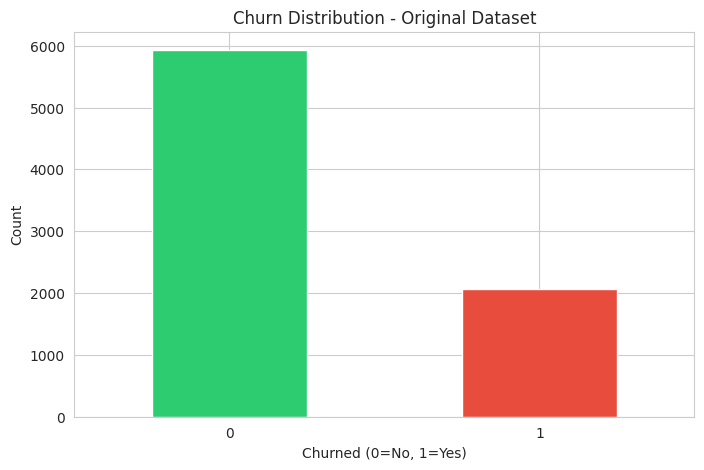

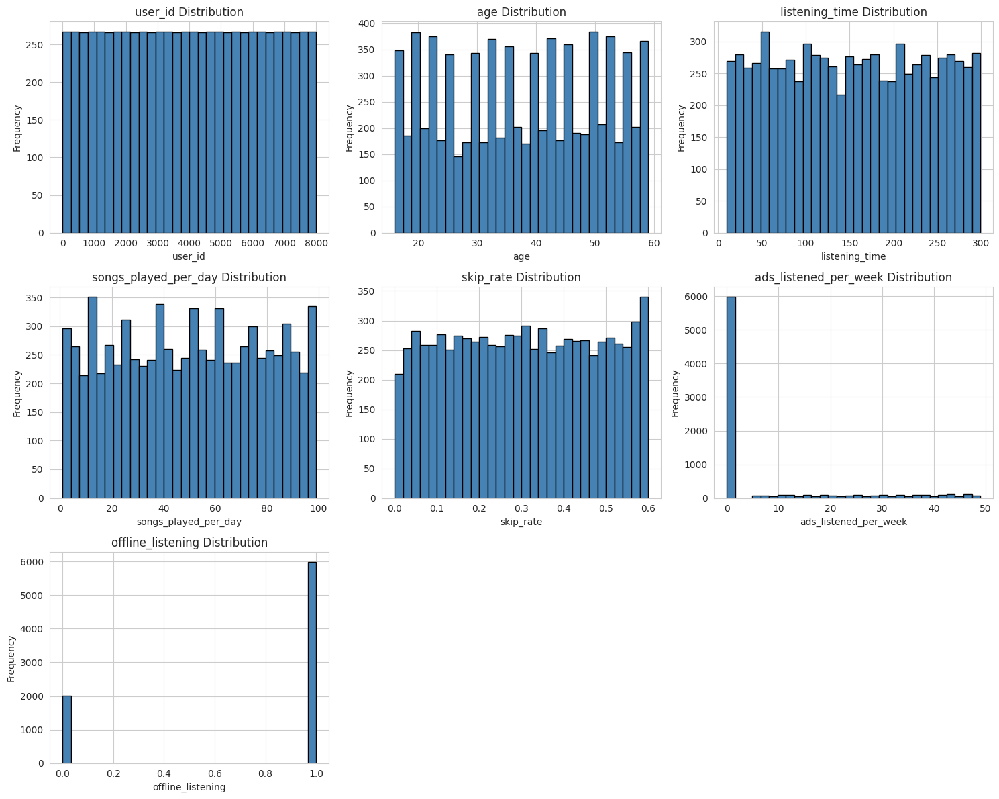

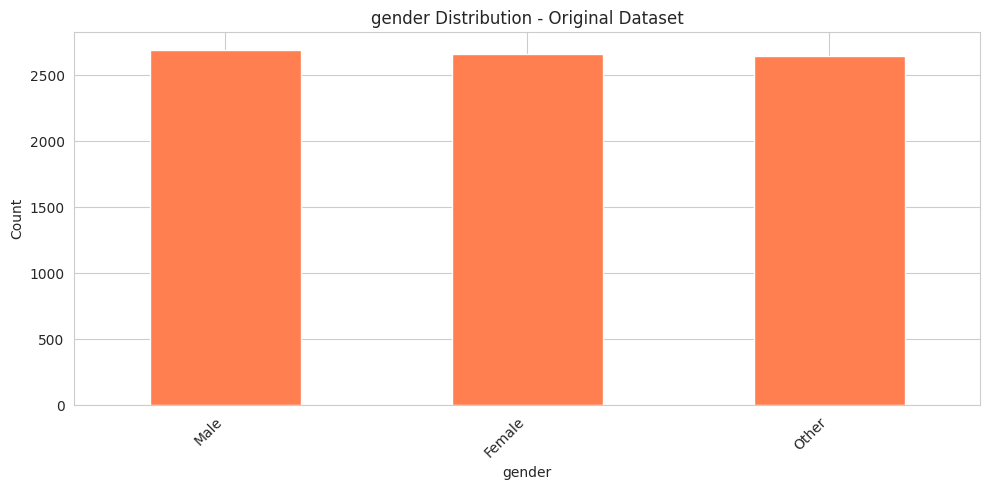

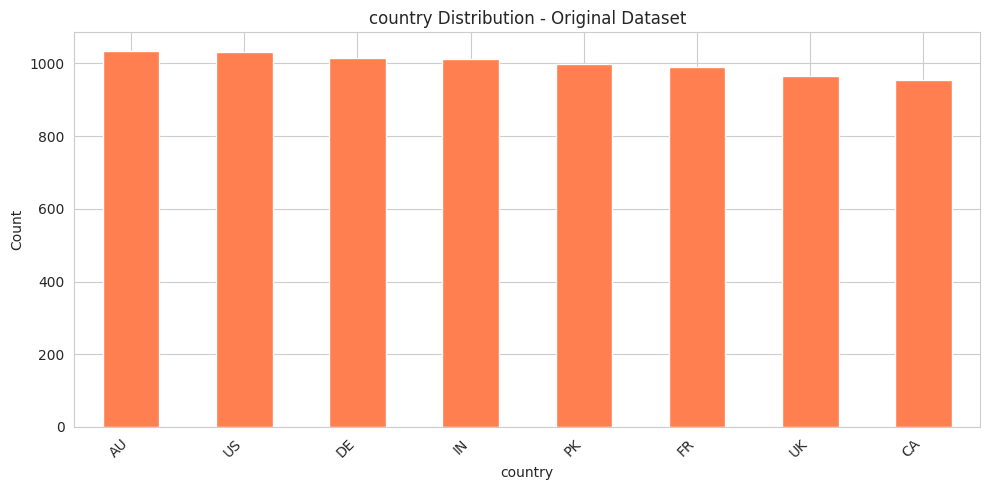

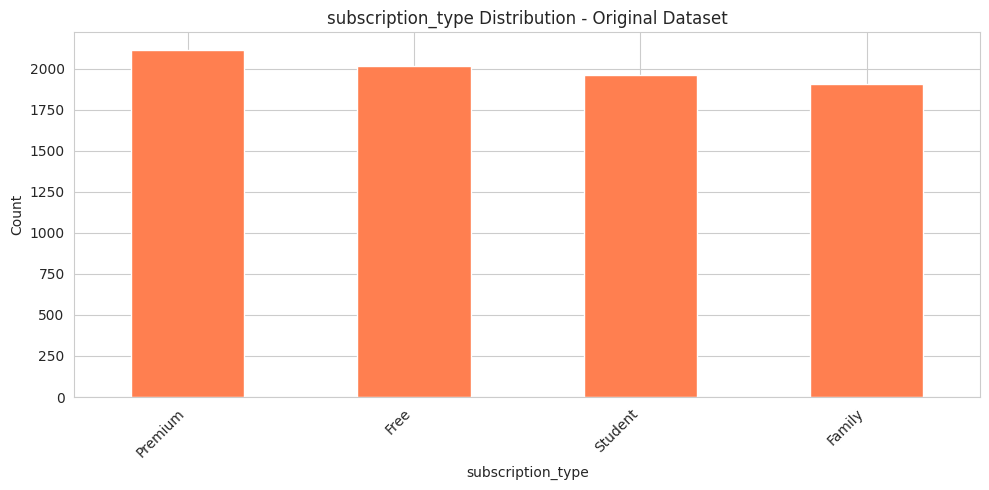

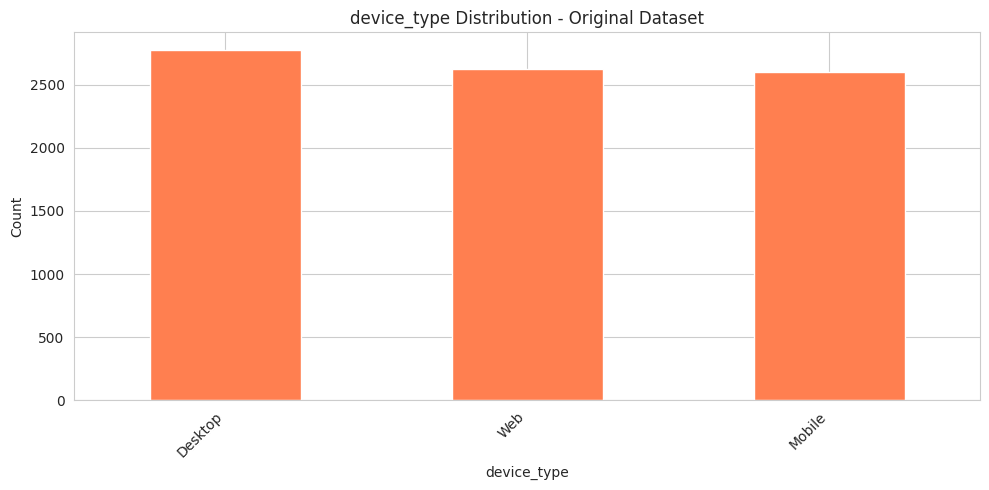

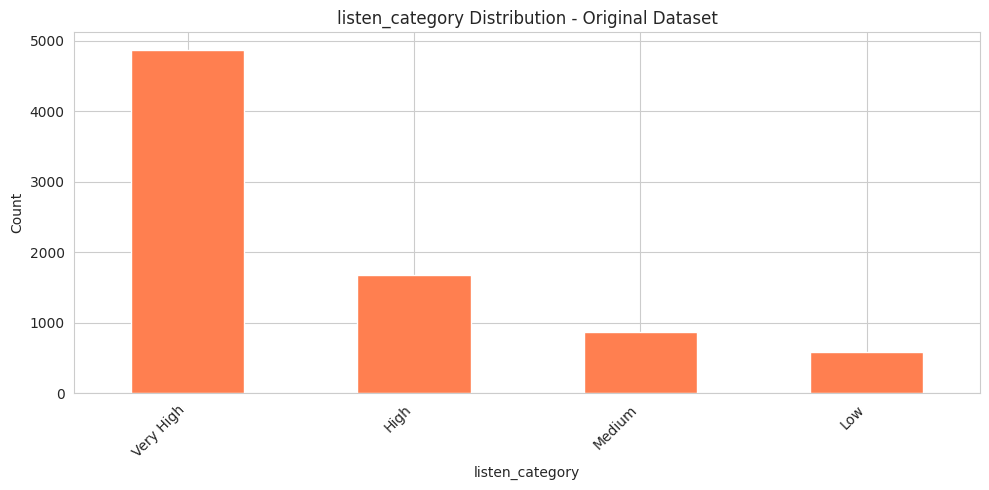

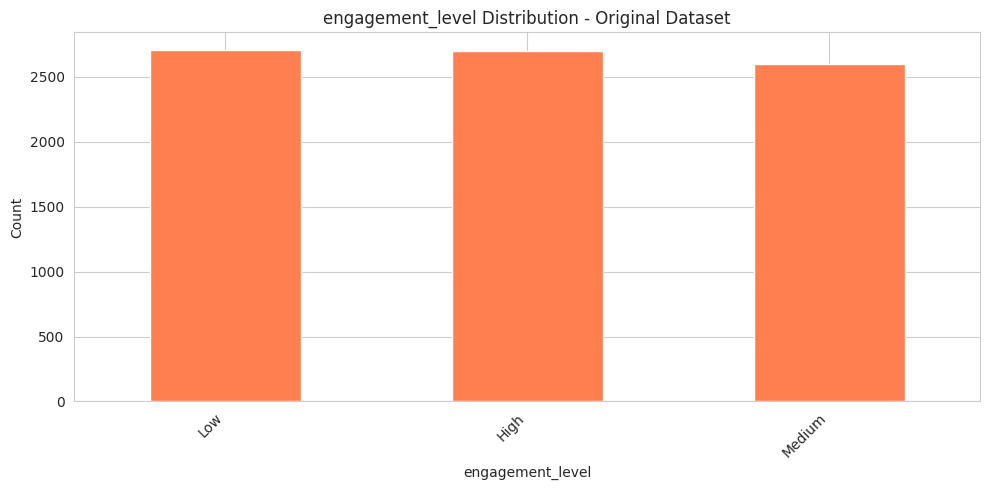

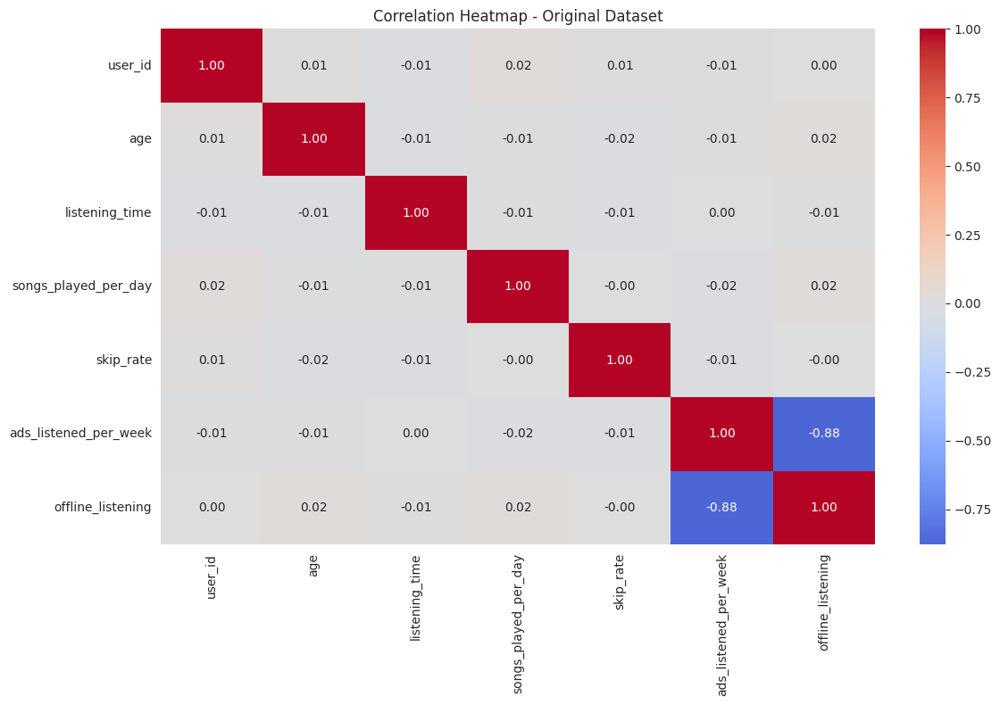

In [19]:
enhanced_eda_plots(spotify_regular, 'Original Dataset')

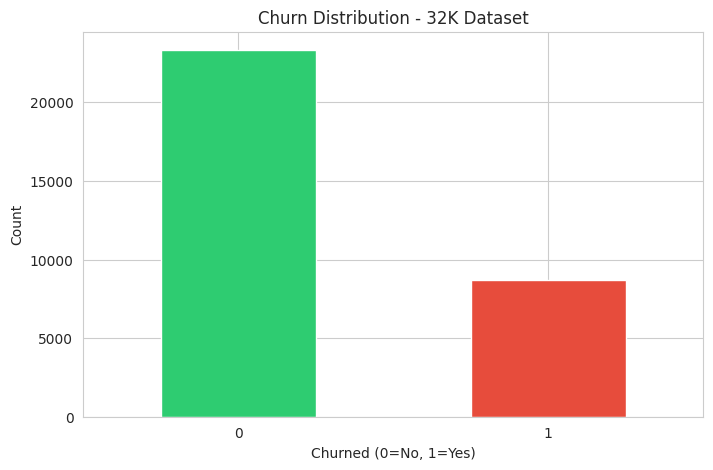

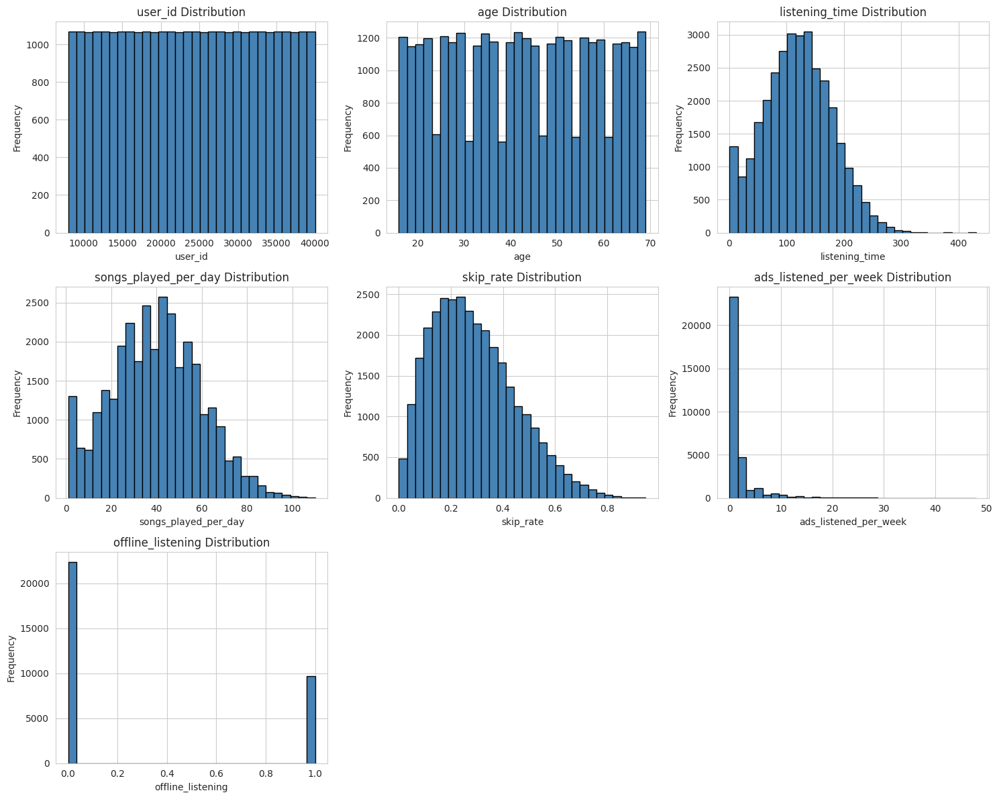

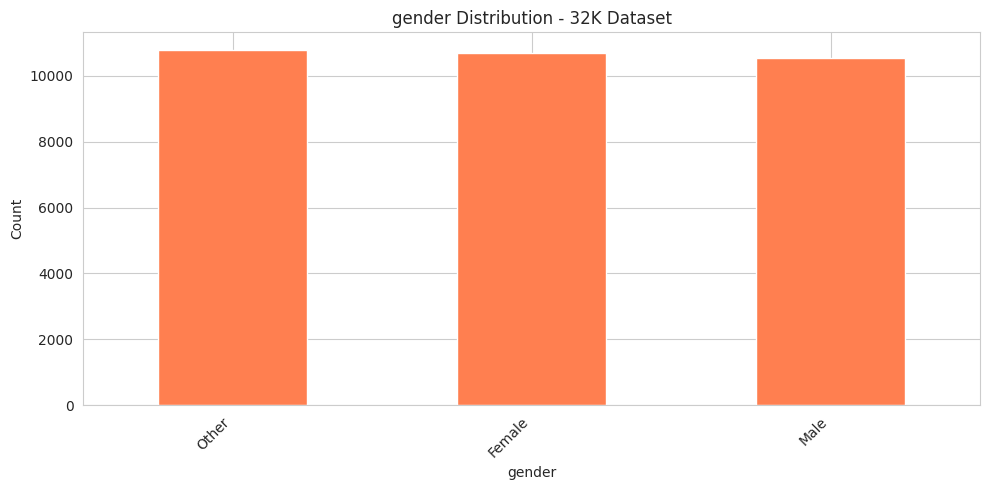

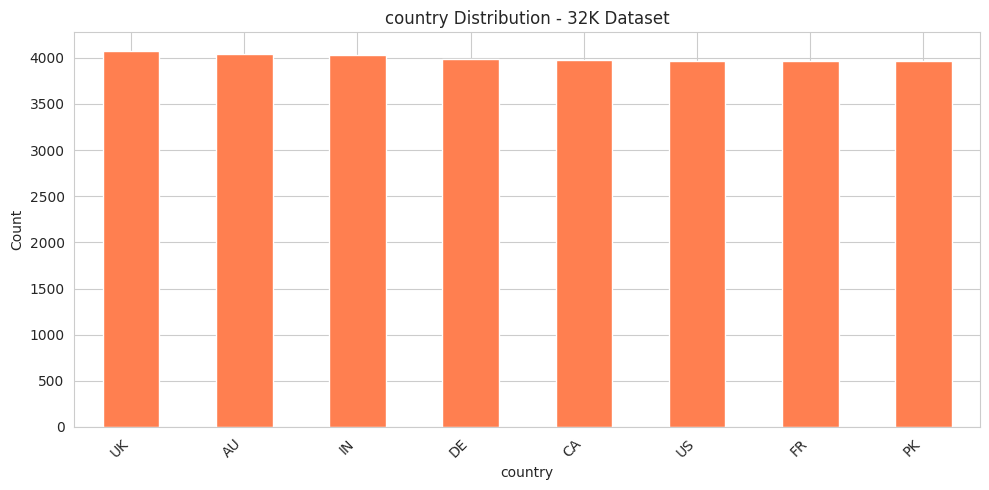

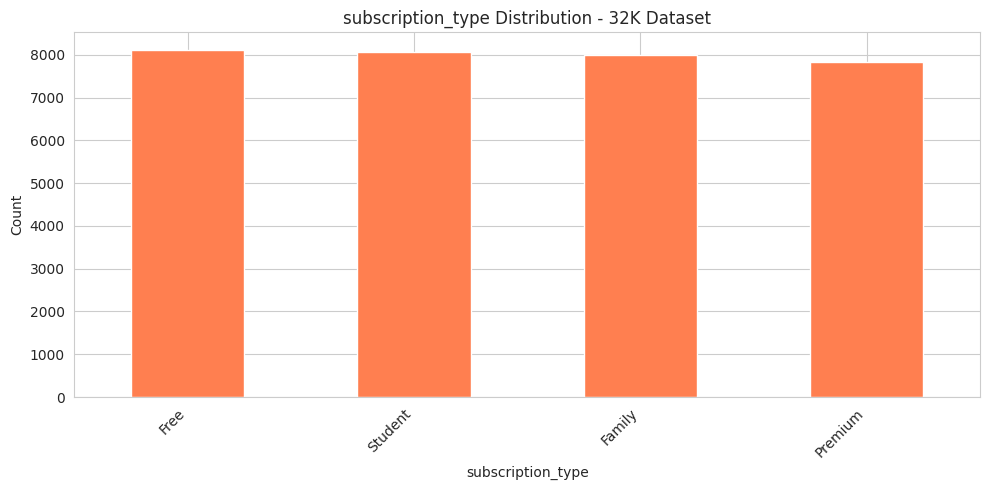

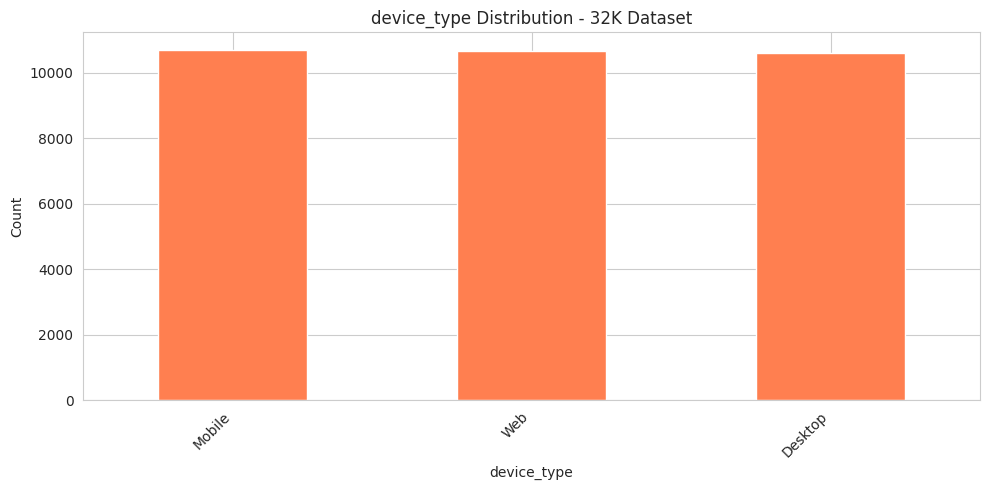

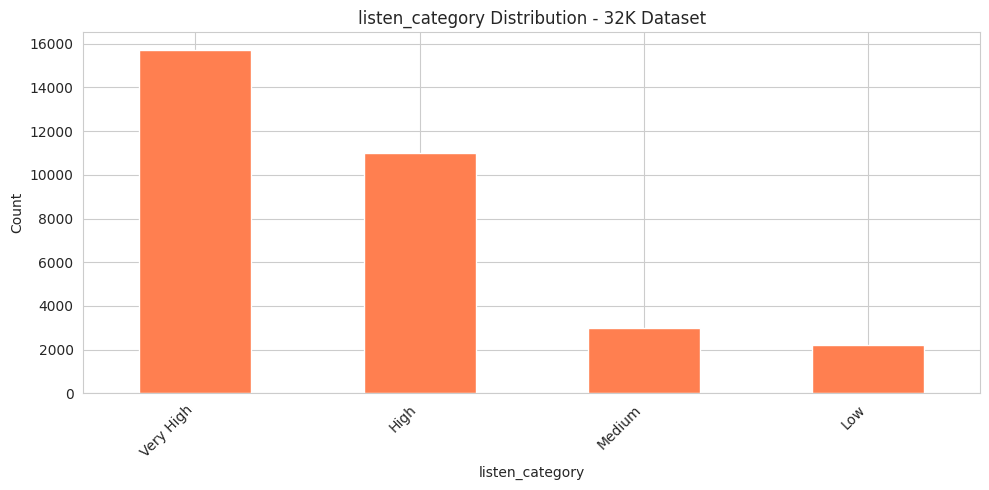

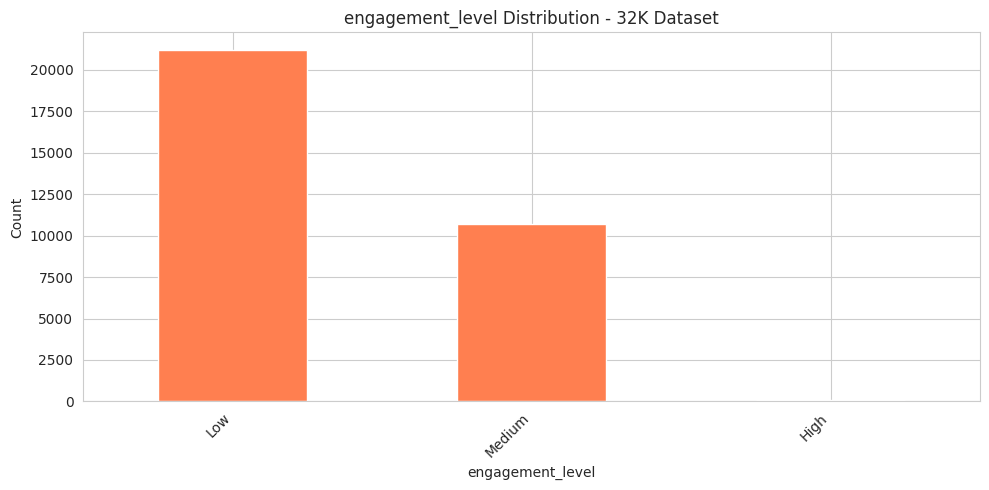

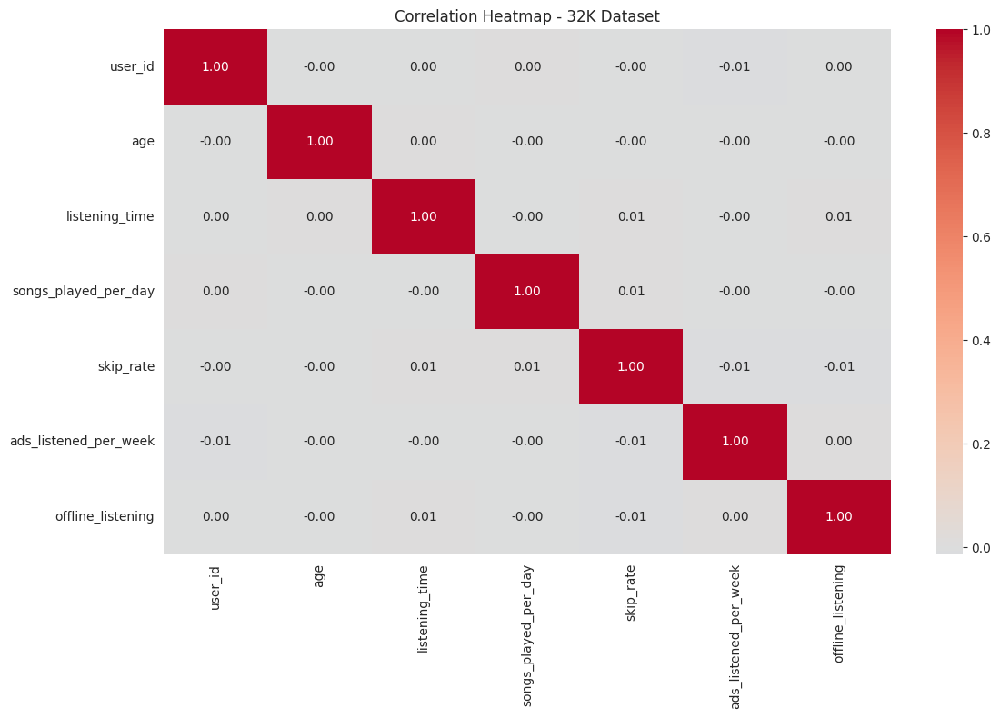

In [20]:
enhanced_eda_plots(spotify_32k, '32K Dataset')

# Advanced EDA Functions

After doing surface level EDA & looking at the relationships through charts, I wanted to go a bit further, and see if there were other relationships I hadn't focused on previously that were still being left out, I created this set of functions to build off of the above chart functions and go more in depth in our visualization process

In [21]:
# 1. BIVARIATE ANALYSIS: Numeric vs Target : compare numeric distributions between churned and retained users
def plot_numeric_vs_churn(df, name):
    numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    if 'is_churned' in numeric_cols:
        numeric_cols.remove('is_churned')

    for col in numeric_cols:
        plt.figure(figsize=(12, 5))

        # subplot 1: Box plot
        plt.subplot(1, 2, 1)
        df.boxplot(column=col, by='is_churned', ax=plt.gca())
        plt.title(f'{col} by Churn Status')
        plt.suptitle('')
        plt.xlabel('Churned (0=No, 1=Yes)')

        # subplot 2: KDE plot
        plt.subplot(1, 2, 2)
        df[df['is_churned']==0][col].plot(kind='kde', label='Retained', color='green')
        df[df['is_churned']==1][col].plot(kind='kde', label='Churned', color='red')
        plt.title(f'{col} Distribution by Churn')
        plt.xlabel(col)
        plt.legend()

        plt.tight_layout()
        plt.show()

# 2. CATEGORICAL VS TARGET ANALYSIS : analyze churn rate across categorical variables
def plot_categorical_vs_churn(df, name):
    cat_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()

    for col in cat_cols:
        churn_by_cat = df.groupby(col)['is_churned'].agg(['mean', 'count'])
        churn_by_cat = churn_by_cat.sort_values('mean', ascending=False)

        fig, axes = plt.subplots(1, 2, figsize=(14, 5))

        # Churn rate
        axes[0].bar(range(len(churn_by_cat)), churn_by_cat['mean'], color='coral')
        axes[0].set_title(f'Churn Rate by {col}')
        axes[0].set_xlabel(col)
        axes[0].set_ylabel('Churn Rate')
        axes[0].set_xticks(range(len(churn_by_cat)))
        axes[0].set_xticklabels(churn_by_cat.index, rotation=45, ha='right')
        axes[0].axhline(df['is_churned'].mean(), color='red', linestyle='--', label='Overall Avg')
        axes[0].legend()

        # Count distribution
        axes[1].bar(range(len(churn_by_cat)), churn_by_cat['count'], color='steelblue')
        axes[1].set_title(f'Sample Size by {col}')
        axes[1].set_xlabel(col)
        axes[1].set_ylabel('Count')
        axes[1].set_xticks(range(len(churn_by_cat)))
        axes[1].set_xticklabels(churn_by_cat.index, rotation=45, ha='right')

        plt.tight_layout()
        plt.show()

# 3. OUTLIER DETECTION : identify outliers using IQR method
def detect_outliers(df, name):
    numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    if 'is_churned' in numeric_cols:
        numeric_cols.remove('is_churned')

    outlier_summary = {}

    for col in numeric_cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
        outlier_summary[col] = {
            'count': len(outliers),
            'percentage': len(outliers) / len(df) * 100,
            'lower_bound': lower_bound,
            'upper_bound': upper_bound
        }

    print(f"\n{'='*60}")
    print(f"OUTLIER DETECTION SUMMARY - {name}")
    print(f"{'='*60}")

    outlier_df = pd.DataFrame(outlier_summary).T
    print(outlier_df.round(2))

    return outlier_df

# 4. FEATURE INTERACTIONS (Pairwise) : explore interactions between key features
#    ex: age vs listening time colored by churn
def plot_feature_interactions(df, name):
    if all(col in df.columns for col in ['age', 'listening_time', 'is_churned']):
        plt.figure(figsize=(10, 6))
        colors = df['is_churned'].map({0: 'green', 1: 'red'})
        plt.scatter(df['age'], df['listening_time'], c=colors, alpha=0.5)
        plt.title(f'Age vs Listening Time (Color = Churn) - {name}')
        plt.xlabel('Age')
        plt.ylabel('Listening Time')
        plt.legend(handles=[
            plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', label='Retained'),
            plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', label='Churned')
        ])
        plt.show()

    # subscription vs device type (Heatmap)
    if all(col in df.columns for col in ['subscription_type', 'device_type', 'is_churned']):
        pivot = df.pivot_table(values='is_churned',
                               index='subscription_type',
                               columns='device_type',
                               aggfunc='mean')
        plt.figure(figsize=(10, 6))
        sns.heatmap(pivot, annot=True, fmt='.2%', cmap='RdYlGn_r')
        plt.title(f'Churn Rate: Subscription × Device - {name}')
        plt.tight_layout()
        plt.show()

# 5. TIME-BASED PATTERNS : analyze patterns over time if temporal features exist
def analyze_temporal_patterns(df, name):
    # Example: Listening time trends
    if 'listening_time' in df.columns:
        # Create listening time bins
        df['listen_category'] = pd.cut(df['listening_time'],
                                        bins=[0, 30, 60, 120, 300],
                                        labels=['Low', 'Medium', 'High', 'Very High'])

        churn_by_listen = df.groupby('listen_category')['is_churned'].mean()

        plt.figure(figsize=(10, 5))
        churn_by_listen.plot(kind='bar', color='purple')
        plt.title(f'Churn Rate by Listening Time Category - {name}')
        plt.xlabel('Listening Time Category')
        plt.ylabel('Churn Rate')
        plt.xticks(rotation=45)
        plt.axhline(df['is_churned'].mean(), color='red', linestyle='--', label='Overall Avg')
        plt.legend()
        plt.tight_layout()
        plt.show()

# 6. STATISTICAL TESTS : perform statistical significance tests
def run_statistical_tests(df, name):
    from scipy import stats

    print(f"\n{'='*60}")
    print(f"STATISTICAL TESTS - {name}")
    print(f"{'='*60}\n")

    numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    if 'is_churned' in numeric_cols:
        numeric_cols.remove('is_churned')

    for col in numeric_cols:
        churned = df[df['is_churned']==1][col].dropna()
        retained = df[df['is_churned']==0][col].dropna()

        # T-test
        t_stat, p_value = stats.ttest_ind(churned, retained)

        print(f"{col}:")
        print(f"  Mean (Churned): {churned.mean():.2f}")
        print(f"  Mean (Retained): {retained.mean():.2f}")
        print(f"  T-statistic: {t_stat:.4f}")
        print(f"  P-value: {p_value:.4f}")
        print(f"  Significant: {'YES' if p_value < 0.05 else 'NO'}\n")

# 7. SEGMENTATION ANALYSIS : create user segments and analyze churn patterns
def perform_segmentation(df, name):
    # ex: segment by subscription type and engagement
    if all(col in df.columns for col in ['subscription_type', 'listening_time']):
        df['engagement_level'] = pd.cut(df['listening_time'],
                                         bins=3,
                                         labels=['Low', 'Medium', 'High'])

        segment_analysis = df.groupby(['subscription_type', 'engagement_level']).agg({
            'is_churned': ['mean', 'count']
        }).round(3)

        print(f"\n{'='*60}")
        print(f"SEGMENTATION ANALYSIS - {name}")
        print(f"{'='*60}\n")
        print(segment_analysis)

        # Visualize
        pivot = df.pivot_table(values='is_churned',
                               index='subscription_type',
                               columns='engagement_level',
                               aggfunc='mean')

        plt.figure(figsize=(10, 6))
        pivot.plot(kind='bar', ax=plt.gca())
        plt.title(f'Churn Rate by Subscription & Engagement - {name}')
        plt.xlabel('Subscription Type')
        plt.ylabel('Churn Rate')
        plt.legend(title='Engagement Level')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

# 8. CHURN PREDICTION INDICATORS : calculate correlations with churn to identify key indicators
def identify_churn_indicators(df, name):
    # encode categorical variables for correlation
    df_encoded = df.copy()
    for col in df_encoded.select_dtypes(include=['object', 'category']).columns:
        df_encoded[col] = df_encoded[col].astype('category').cat.codes

    # calculate correlations with churn
    correlations = df_encoded.corr()['is_churned'].sort_values(ascending=False)
    correlations = correlations.drop('is_churned')

    print(f"\n{'='*60}")
    print(f"TOP CHURN INDICATORS - {name}")
    print(f"{'='*60}\n")
    print("Most Positive Correlations (Risk Factors):")
    print(correlations.head(10))
    print("\nMost Negative Correlations (Protective Factors):")
    print(correlations.tail(10))

    # visualize
    plt.figure(figsize=(10, 8))
    top_features = pd.concat([correlations.head(10), correlations.tail(10)])
    colors = ['red' if x > 0 else 'green' for x in top_features.values]
    top_features.plot(kind='barh', color=colors)
    plt.title(f'Top Features Correlated with Churn - {name}')
    plt.xlabel('Correlation Coefficient')
    plt.axvline(0, color='black', linewidth=0.8)
    plt.tight_layout()
    plt.show()

# ============================================
# function that takes all above functions and makes a mega func (suite) for running advanced eda
# ============================================

def complete_eda_suite(df, name):
    """Run all EDA analyses in sequence"""
    print(f"\n{'#'*60}")
    print(f"# COMPREHENSIVE EDA FOR: {name}")
    print(f"{'#'*60}\n")

    # Basic plots (from earlier)
    enhanced_eda_plots(df, name)

    # Advanced analyses
    plot_numeric_vs_churn(df, name)
    plot_categorical_vs_churn(df, name)
    detect_outliers(df, name)
    plot_feature_interactions(df, name)
    analyze_temporal_patterns(df, name)
    run_statistical_tests(df, name)
    perform_segmentation(df, name)
    identify_churn_indicators(df, name)

    print(f"\n{'#'*60}")
    print(f"# EDA COMPLETE FOR: {name}")
    print(f"{'#'*60}\n")


############################################################
# COMPREHENSIVE EDA FOR: Original Dataset
############################################################



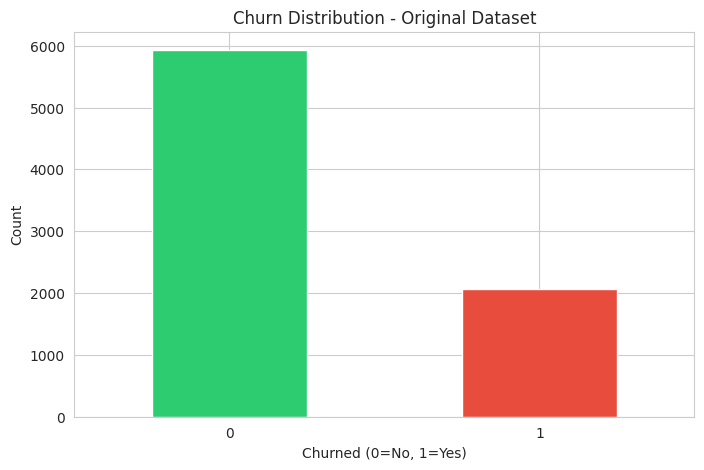

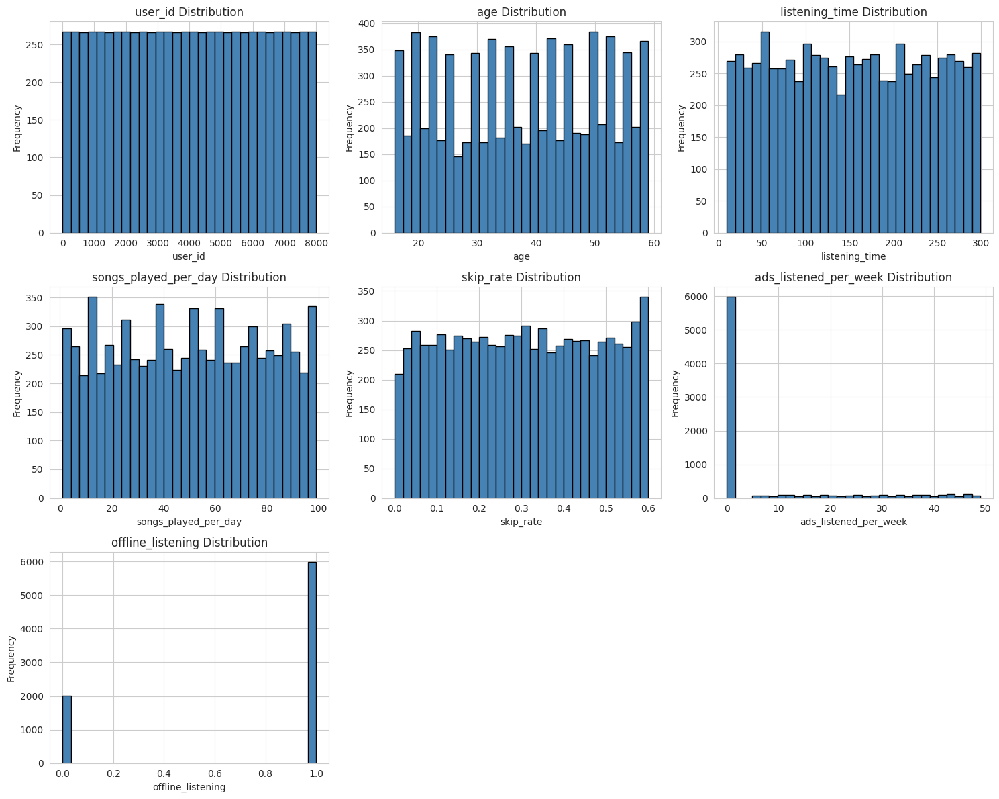

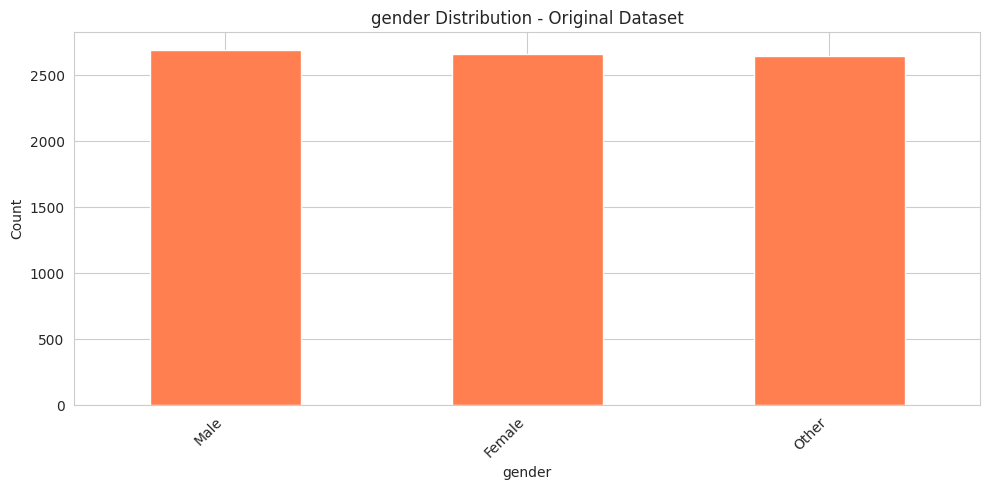

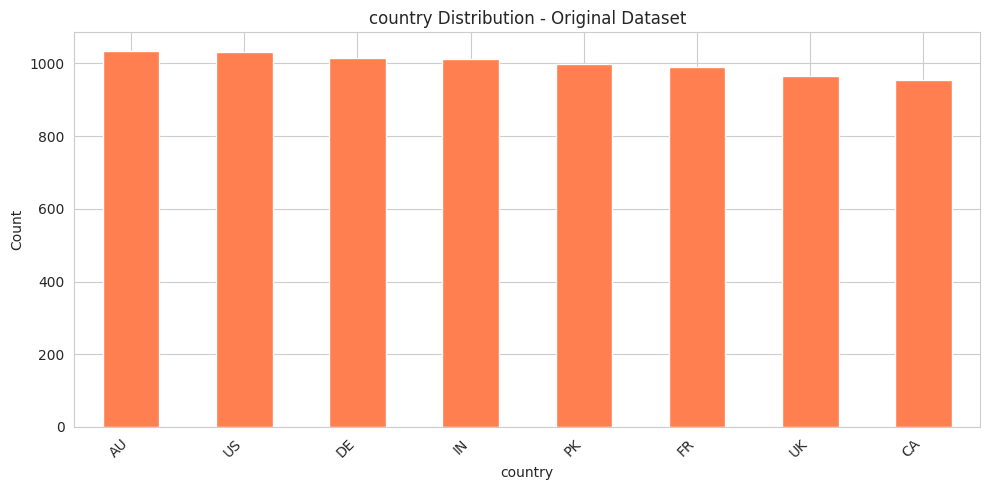

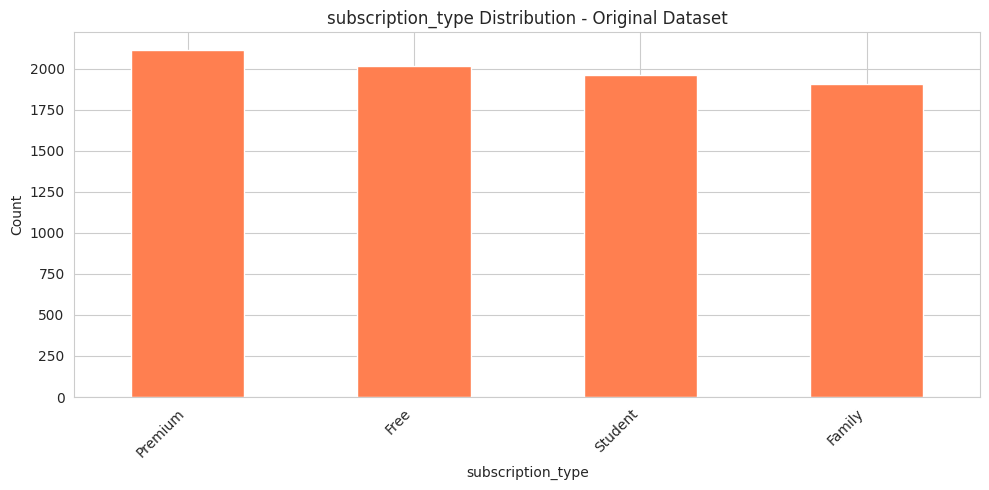

...

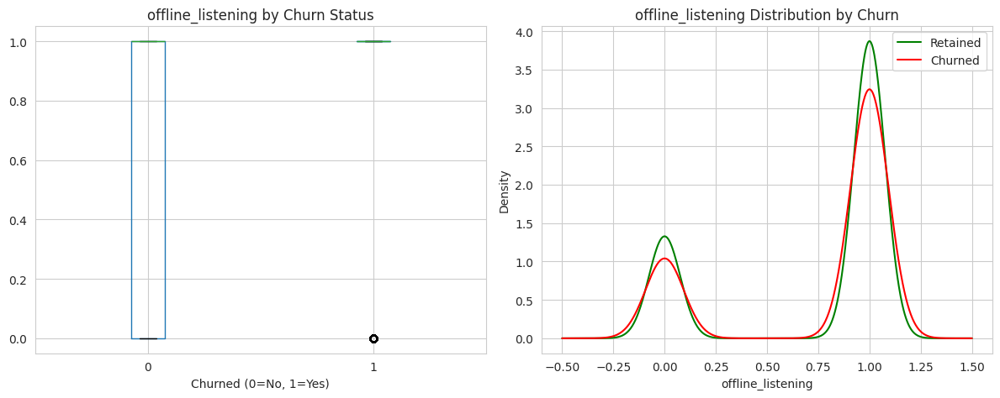

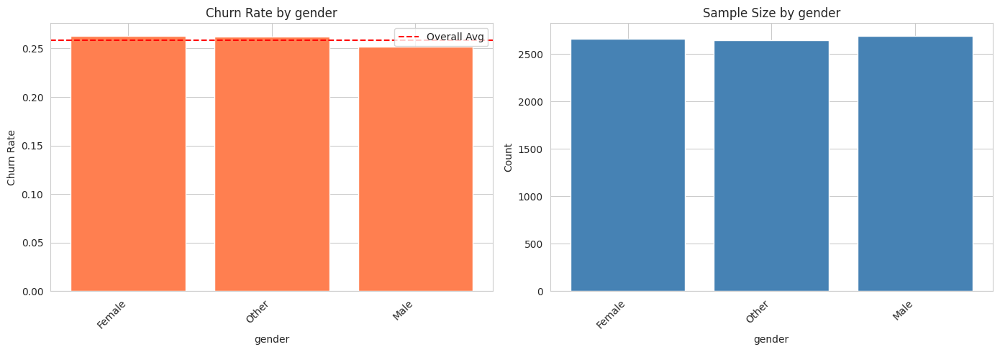

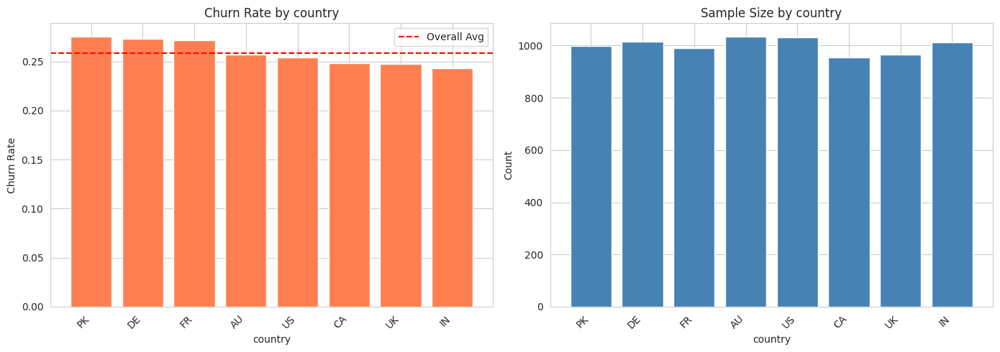

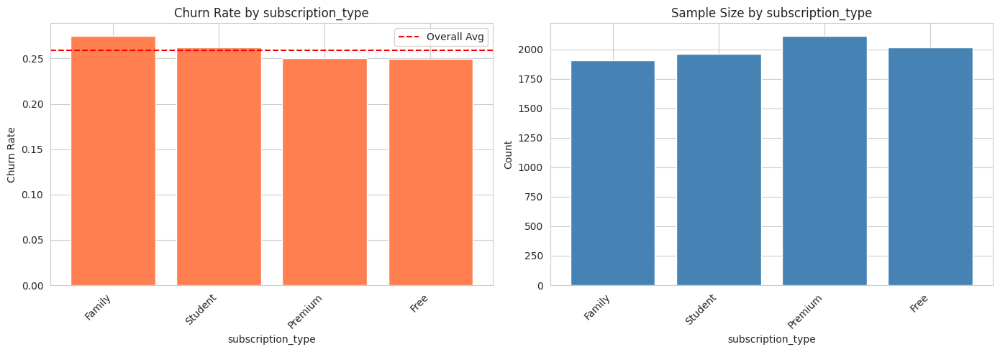

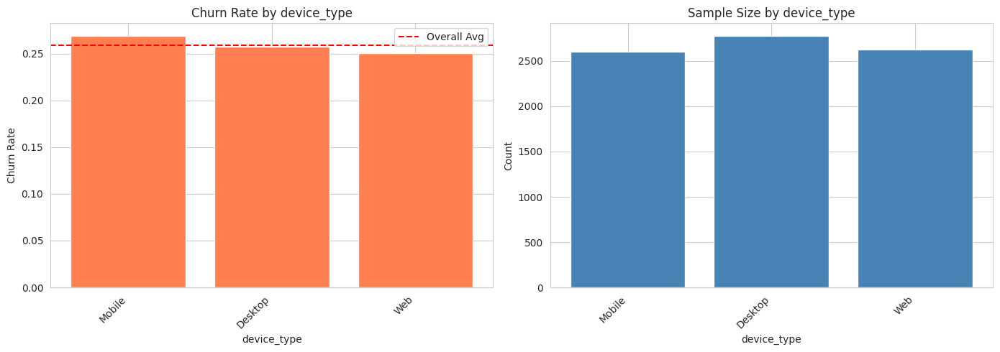

/tmp/ipython-input-1489699460.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  churn_by_cat = df.groupby(col)['is_churned'].agg(['mean', 'count'])


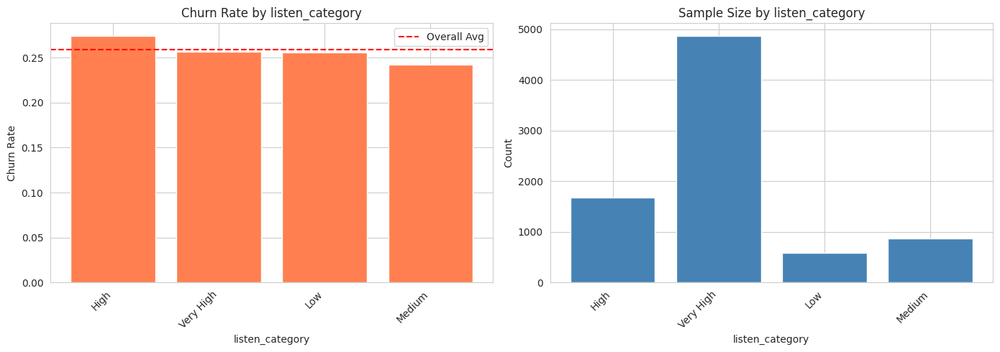

/tmp/ipython-input-1489699460.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  churn_by_cat = df.groupby(col)['is_churned'].agg(['mean', 'count'])


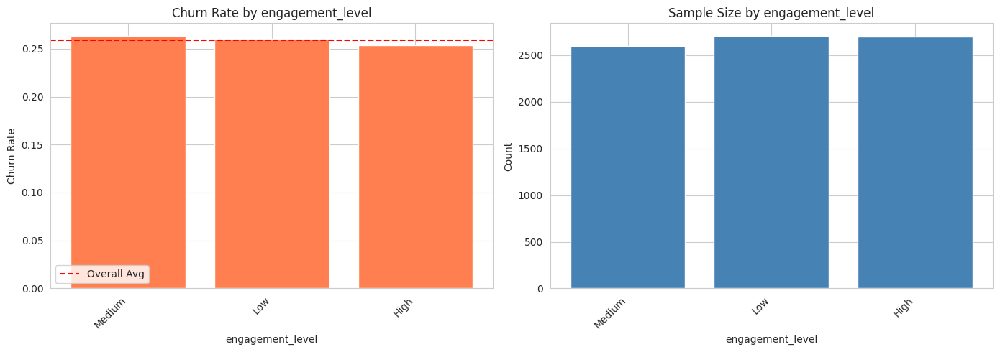


OUTLIER DETECTION SUMMARY - Original Dataset
                        count  percentage  lower_bound  upper_bound
user_id                   0.0        0.00      -3998.5      11999.5
age                       0.0        0.00         -8.5         83.5
listening_time            0.0        0.00       -138.0        446.0
songs_played_per_day      0.0        0.00        -50.0        150.0
skip_rate                 0.0        0.00         -0.3          0.9
ads_listened_per_week  1683.0       21.04         -7.5         12.5
offline_listening         0.0        0.00         -1.5          2.5


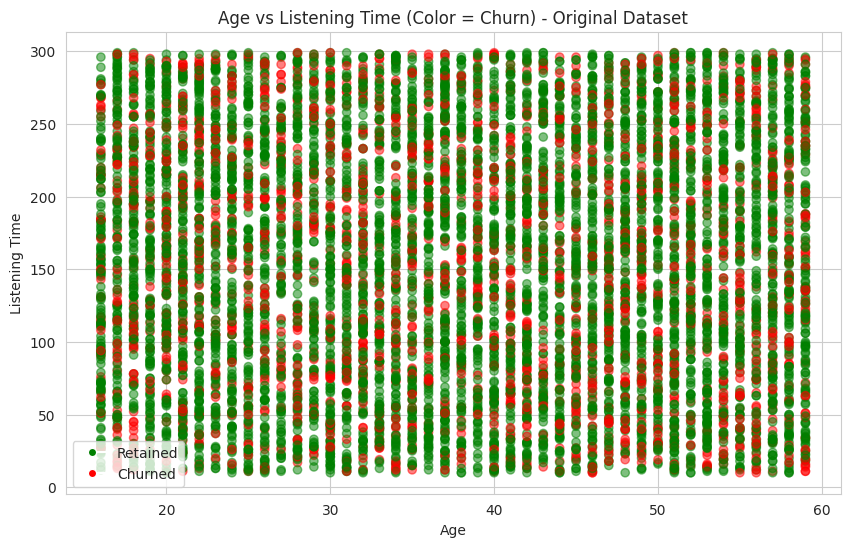

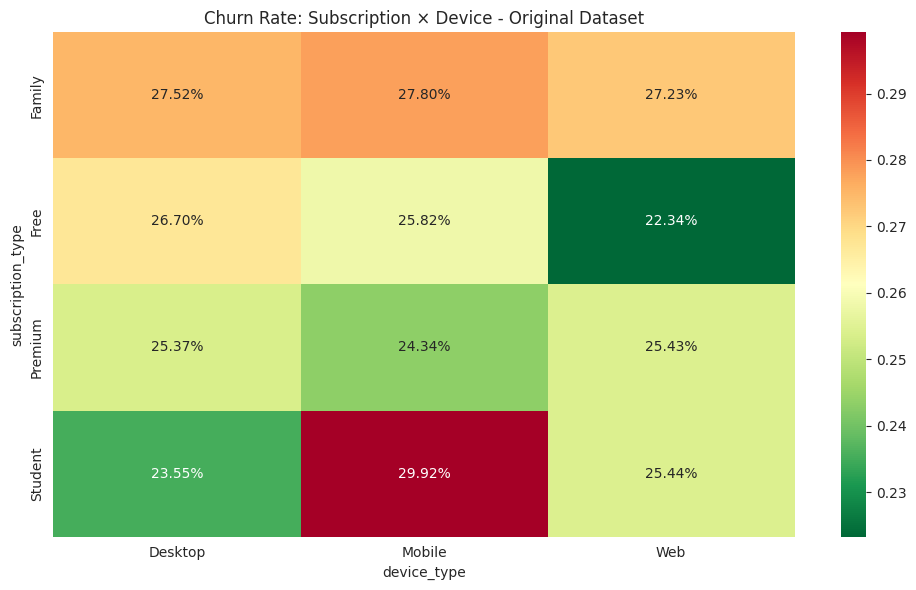

/tmp/ipython-input-1489699460.py:128: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  churn_by_listen = df.groupby('listen_category')['is_churned'].mean()


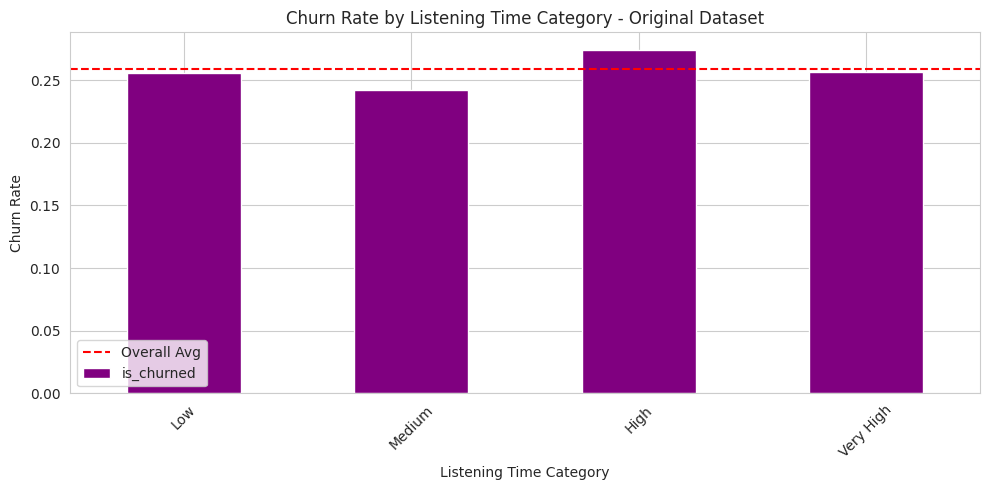


STATISTICAL TESTS - Original Dataset

user_id:
  Mean (Churned): 3938.00
  Mean (Retained): 4022.33
  T-statistic: -1.4306
  P-value: 0.1526
  Significant: NO

age:
  Mean (Churned): 37.75
  Mean (Retained): 37.63
  T-statistic: 0.3561
  P-value: 0.7218
  Significant: NO

listening_time:
  Mean (Churned): 152.98
  Mean (Retained): 154.45
  T-statistic: -0.6818
  P-value: 0.4954
  Significant: NO

songs_played_per_day:
  Mean (Churned): 50.58
  Mean (Retained): 49.97
  T-statistic: 0.8330
  P-value: 0.4049
  Significant: NO

skip_rate:
  Mean (Churned): 0.30
  Mean (Retained): 0.30
  T-statistic: 1.4419
  P-value: 0.1494
  Significant: NO

ads_listened_per_week:
  Mean (Churned): 6.89
  Mean (Retained): 6.96
  T-statistic: -0.2039
  P-value: 0.8385
  Significant: NO

offline_listening:
  Mean (Churned): 0.76
  Mean (Retained): 0.74
  T-statistic: 1.1407
  P-value: 0.2540
  Significant: NO


SEGMENTATION ANALYSIS - Original Dataset

                                   is_churned      
  

/tmp/ipython-input-1489699460.py:175: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  segment_analysis = df.groupby(['subscription_type', 'engagement_level']).agg({
/tmp/ipython-input-1489699460.py:185: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot = df.pivot_table(values='is_churned',


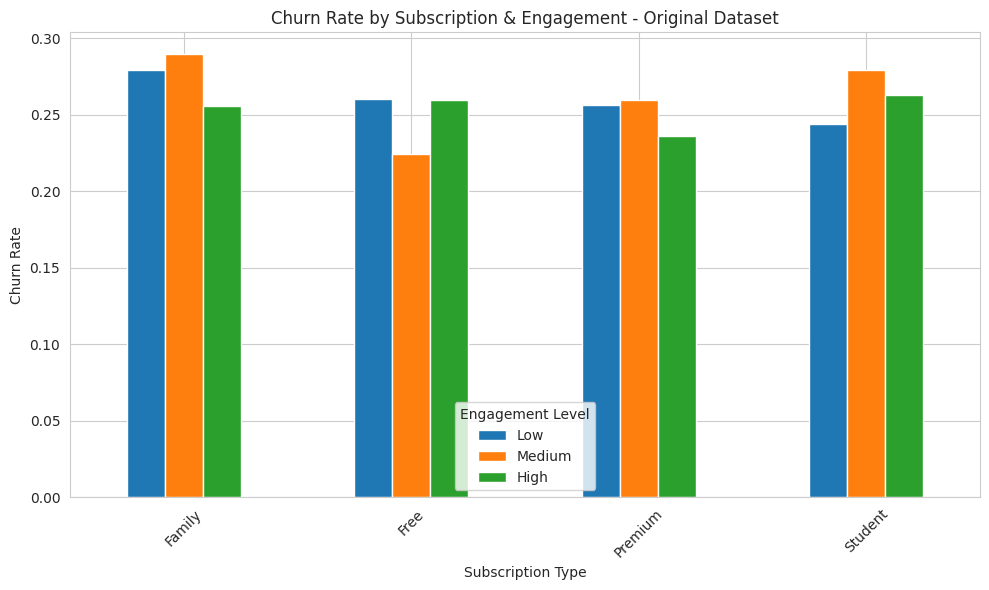


TOP CHURN INDICATORS - Original Dataset

Most Positive Correlations (Risk Factors):
skip_rate                0.016121
offline_listening        0.012754
songs_played_per_day     0.009314
age                      0.003982
listen_category          0.002123
gender                  -0.000935
ads_listened_per_week   -0.002279
country                 -0.003236
device_type             -0.006210
engagement_level        -0.006303
Name: is_churned, dtype: float64

Most Negative Correlations (Protective Factors):
age                      0.003982
listen_category          0.002123
gender                  -0.000935
ads_listened_per_week   -0.002279
country                 -0.003236
device_type             -0.006210
engagement_level        -0.006303
listening_time          -0.007624
subscription_type       -0.009537
user_id                 -0.015994
Name: is_churned, dtype: float64


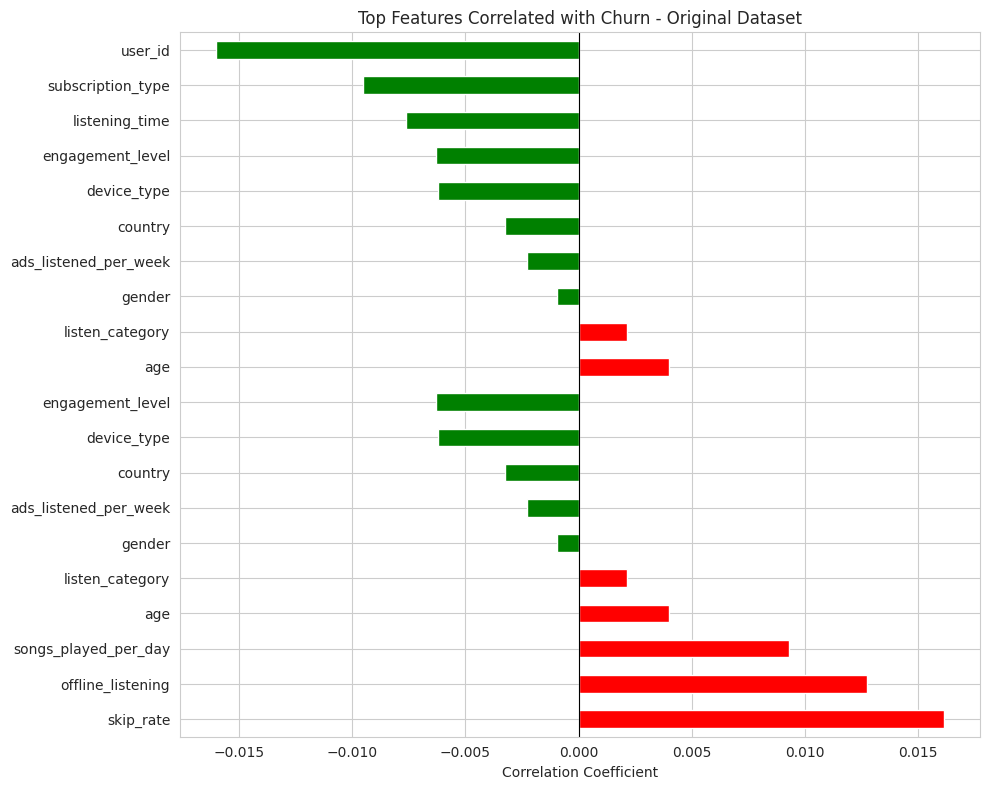


############################################################
# EDA COMPLETE FOR: Original Dataset
############################################################



In [22]:
# Run complete suite on both datasets
complete_eda_suite(spotify_regular, 'Original Dataset')


############################################################
# COMPREHENSIVE EDA FOR: 32K Dataset
############################################################



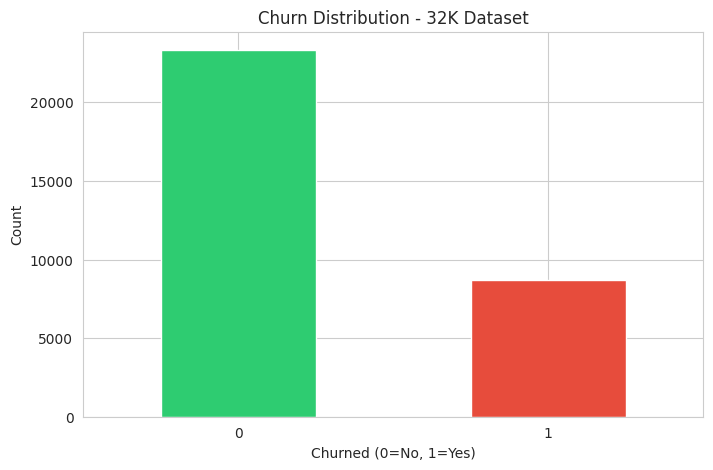

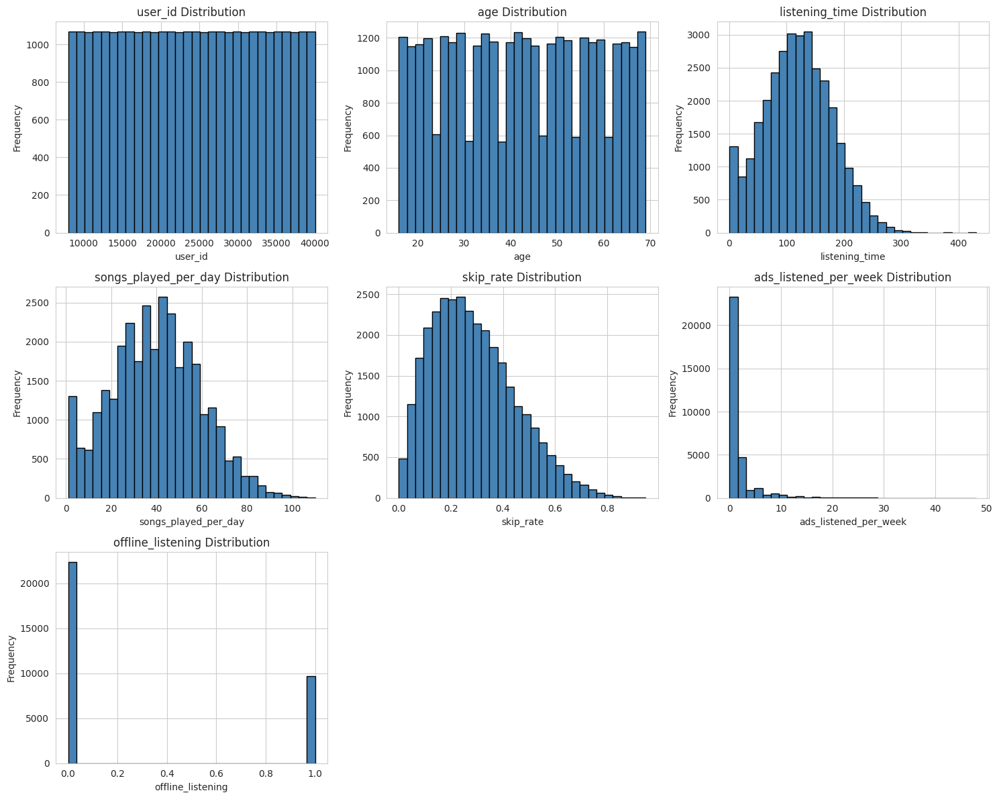

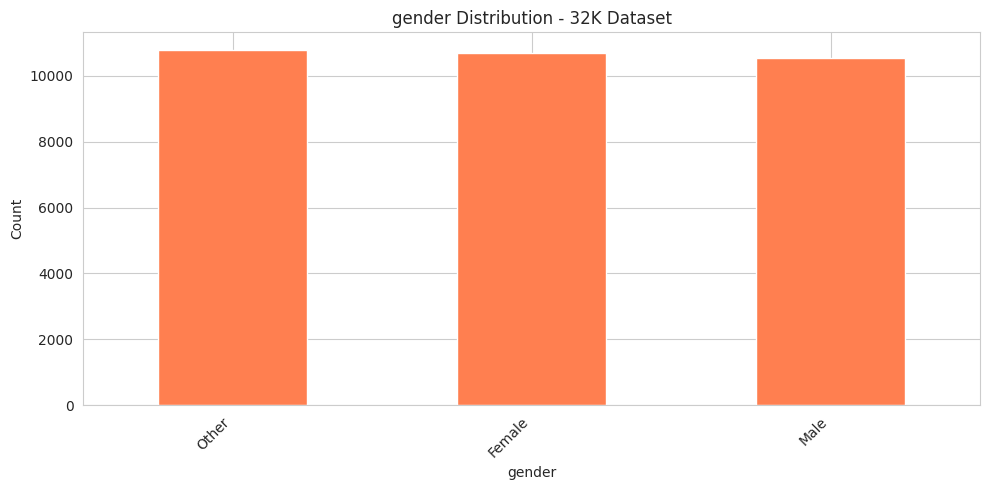

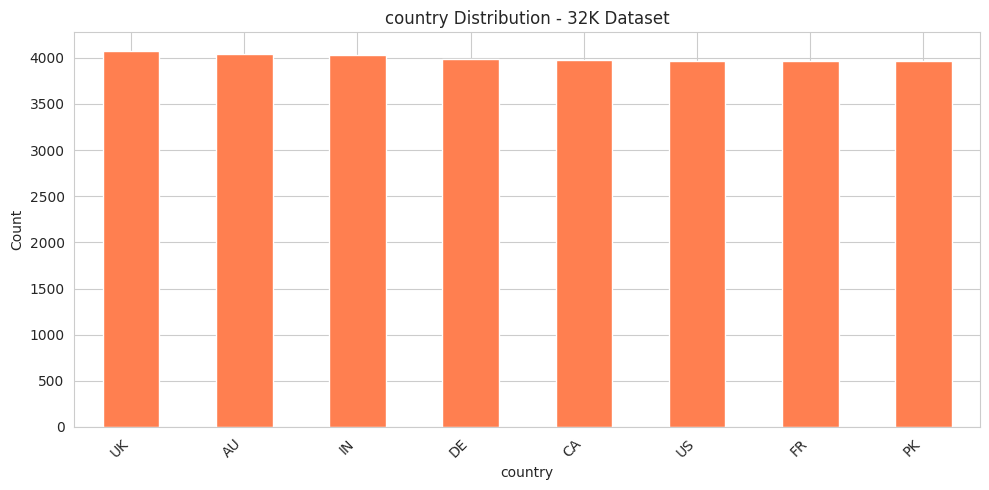

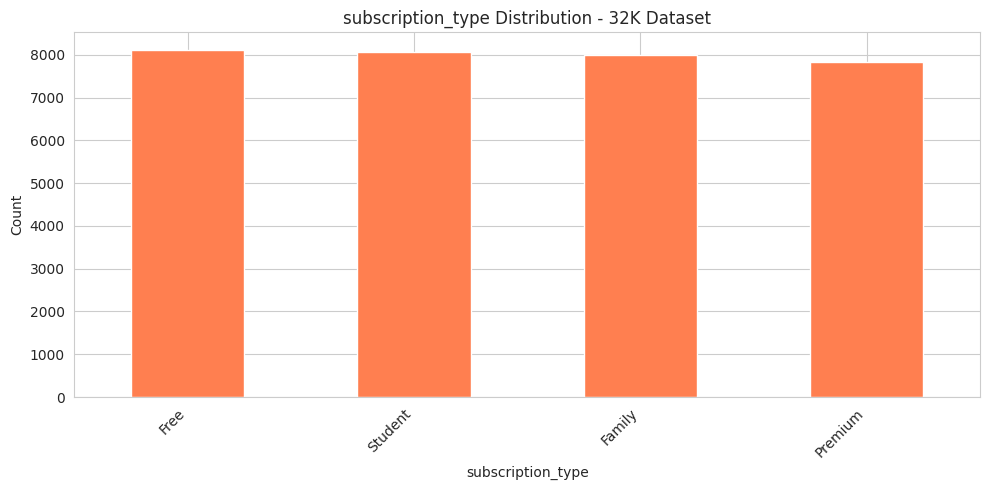

...

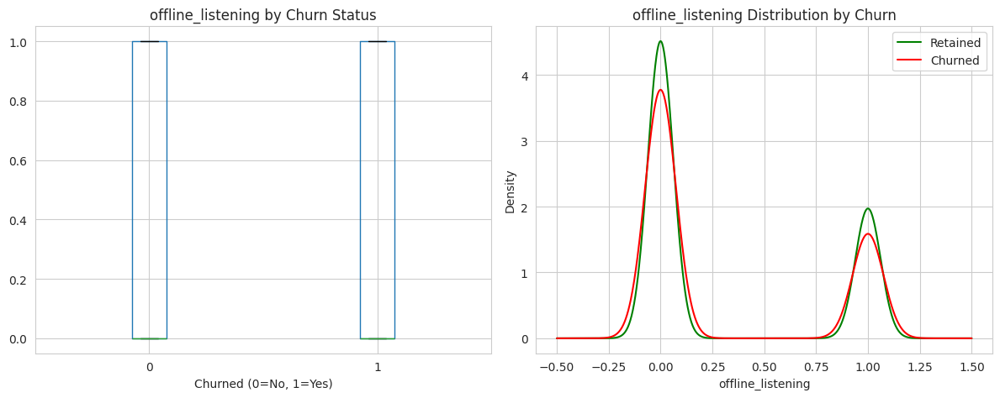

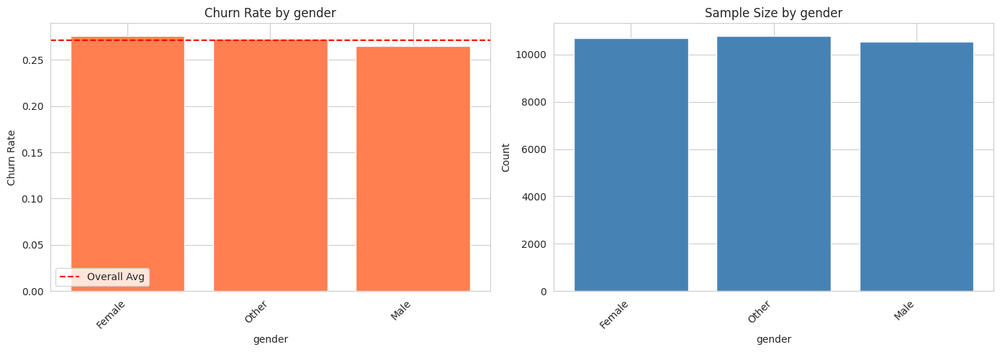

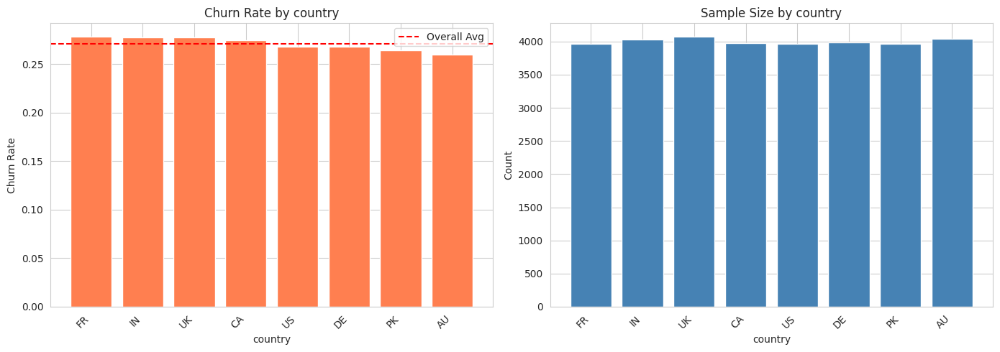

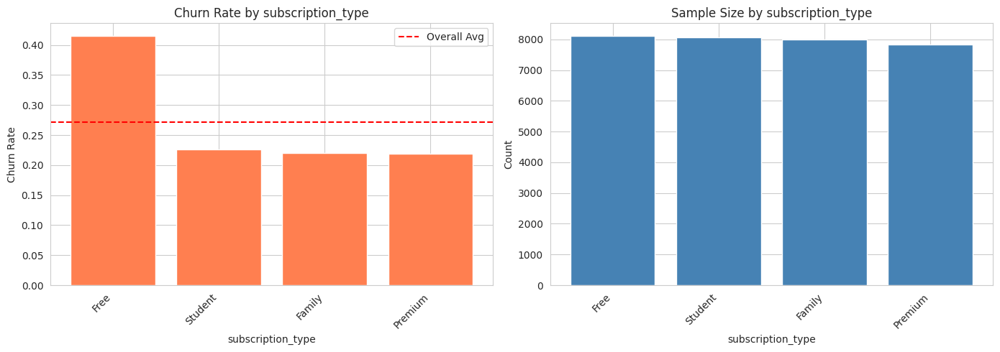

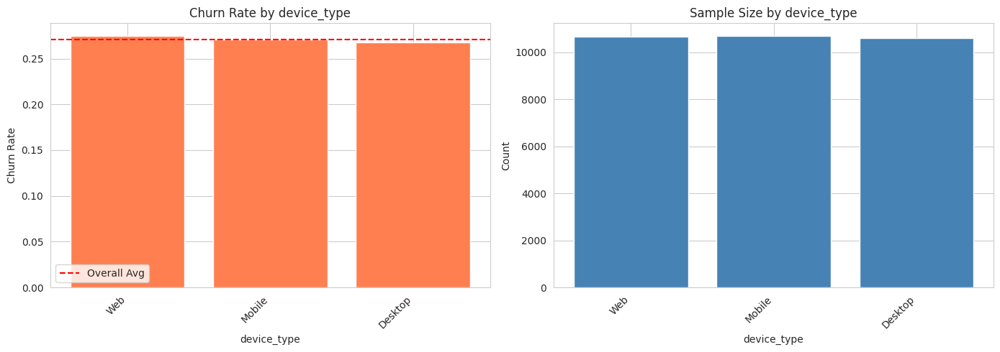

/tmp/ipython-input-1489699460.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  churn_by_cat = df.groupby(col)['is_churned'].agg(['mean', 'count'])


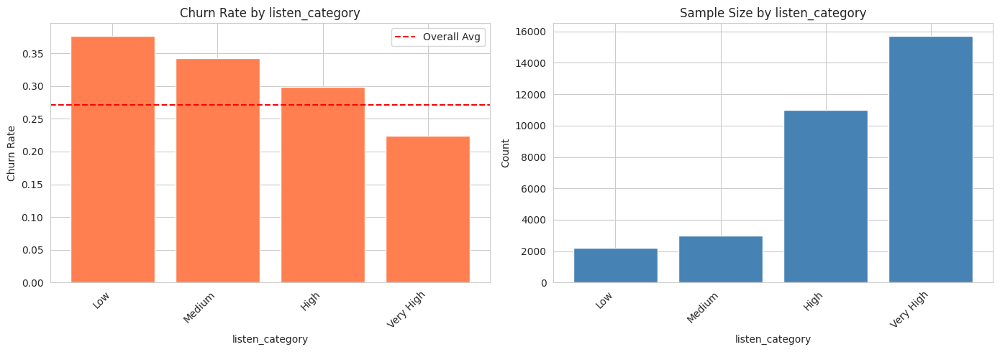

/tmp/ipython-input-1489699460.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  churn_by_cat = df.groupby(col)['is_churned'].agg(['mean', 'count'])


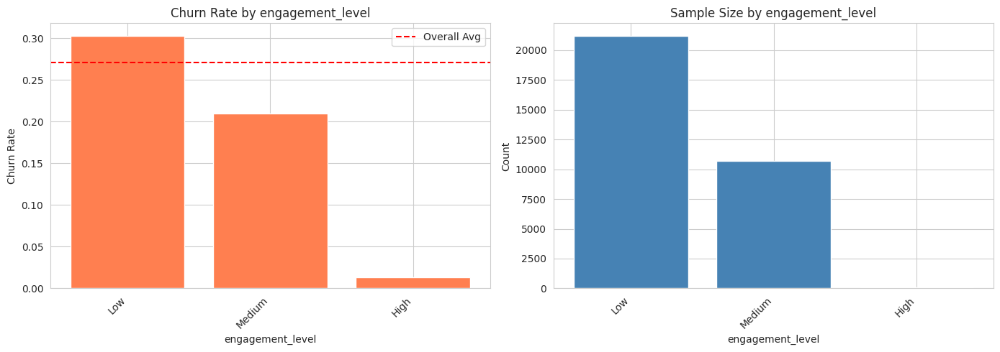


OUTLIER DETECTION SUMMARY - 32K Dataset
                        count  percentage  lower_bound  upper_bound
user_id                   0.0        0.00     -7998.50     55999.50
age                       0.0        0.00       -11.50        96.50
listening_time          105.0        0.33       -42.50       281.50
songs_played_per_day     99.0        0.31       -14.50        93.50
skip_rate               220.0        0.69        -0.18         0.73
ads_listened_per_week  2472.0        7.72        -3.00         5.00
offline_listening         0.0        0.00        -1.50         2.50


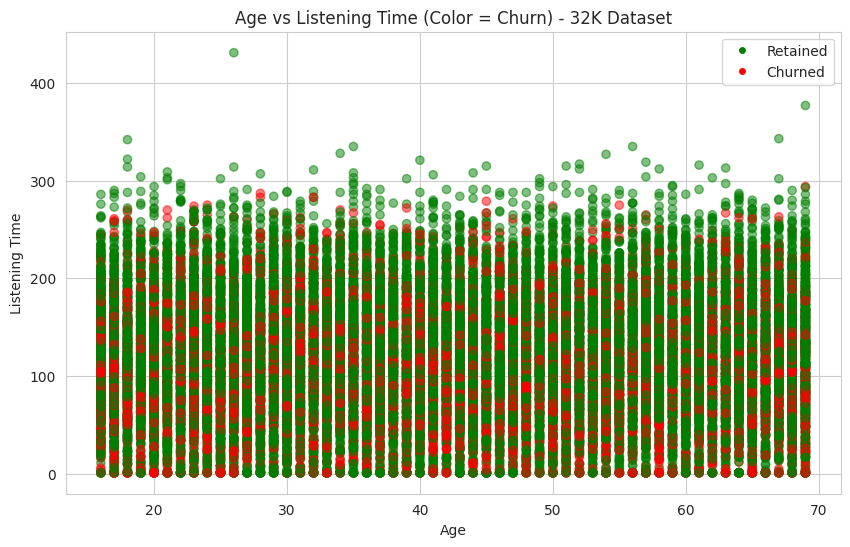

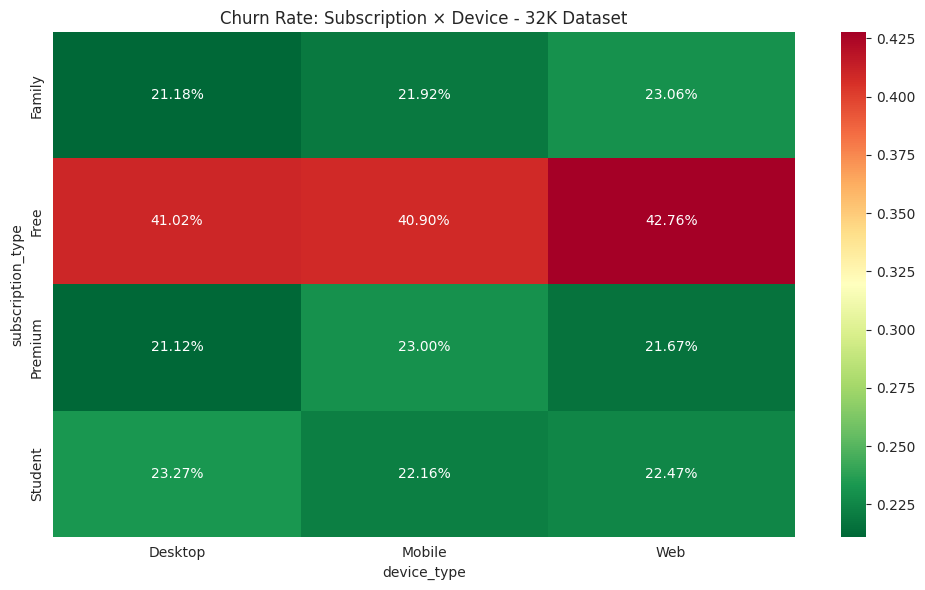

/tmp/ipython-input-1489699460.py:128: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  churn_by_listen = df.groupby('listen_category')['is_churned'].mean()


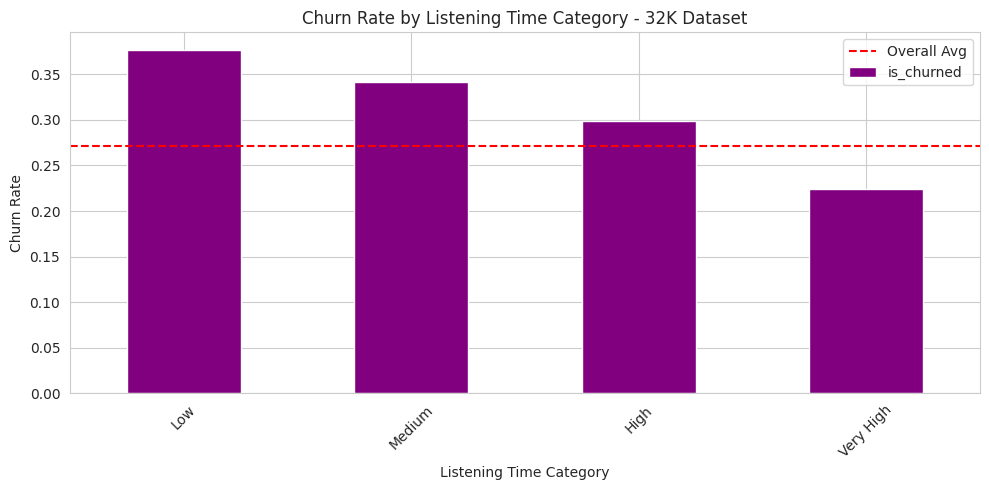


STATISTICAL TESTS - 32K Dataset

user_id:
  Mean (Churned): 23921.82
  Mean (Retained): 24029.77
  T-statistic: -0.9293
  P-value: 0.3528
  Significant: NO

age:
  Mean (Churned): 42.39
  Mean (Retained): 42.54
  T-statistic: -0.7440
  P-value: 0.4569
  Significant: NO

listening_time:
  Mean (Churned): 107.61
  Mean (Retained): 124.59
  T-statistic: -23.1846
  P-value: 0.0000
  Significant: YES

songs_played_per_day:
  Mean (Churned): 39.73
  Mean (Retained): 39.73
  T-statistic: 0.0203
  P-value: 0.9838
  Significant: NO

skip_rate:
  Mean (Churned): 0.33
  Mean (Retained): 0.27
  T-statistic: 31.0748
  P-value: 0.0000
  Significant: YES

ads_listened_per_week:
  Mean (Churned): 2.12
  Mean (Retained): 1.36
  T-statistic: 19.2637
  P-value: 0.0000
  Significant: YES

offline_listening:
  Mean (Churned): 0.30
  Mean (Retained): 0.30
  T-statistic: -1.3915
  P-value: 0.1641
  Significant: NO


SEGMENTATION ANALYSIS - 32K Dataset

                                   is_churned      
   

/tmp/ipython-input-1489699460.py:175: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  segment_analysis = df.groupby(['subscription_type', 'engagement_level']).agg({
/tmp/ipython-input-1489699460.py:185: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot = df.pivot_table(values='is_churned',


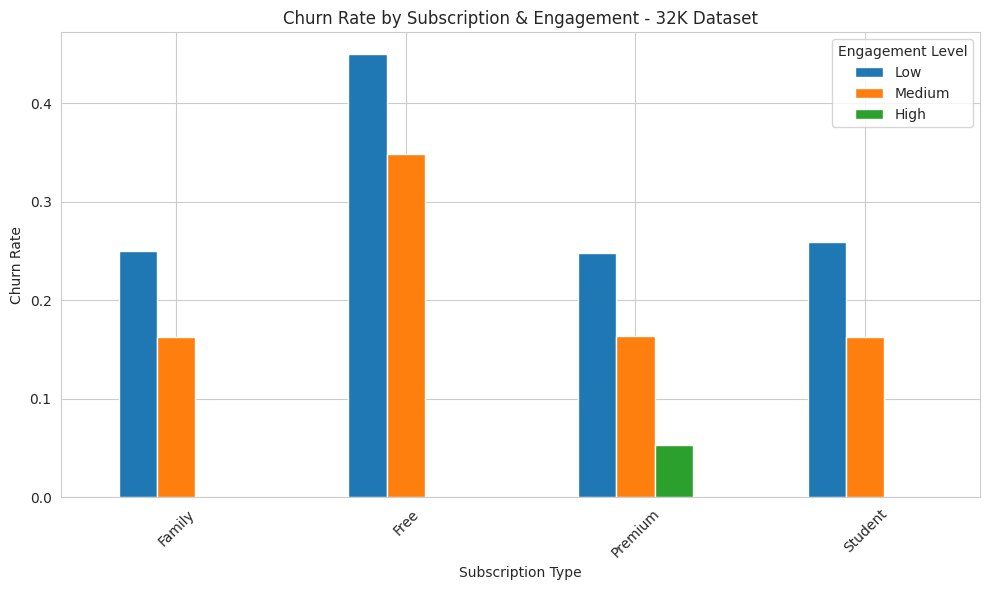


TOP CHURN INDICATORS - 32K Dataset

Most Positive Correlations (Risk Factors):
skip_rate                0.171155
ads_listened_per_week    0.107071
device_type              0.006410
country                  0.003728
songs_played_per_day     0.000114
gender                  -0.002938
age                     -0.004159
user_id                 -0.005195
offline_listening       -0.007779
subscription_type       -0.045399
Name: is_churned, dtype: float64

Most Negative Correlations (Protective Factors):
country                 0.003728
songs_played_per_day    0.000114
gender                 -0.002938
age                    -0.004159
user_id                -0.005195
offline_listening      -0.007779
subscription_type      -0.045399
engagement_level       -0.102083
listen_category        -0.108915
listening_time         -0.128535
Name: is_churned, dtype: float64


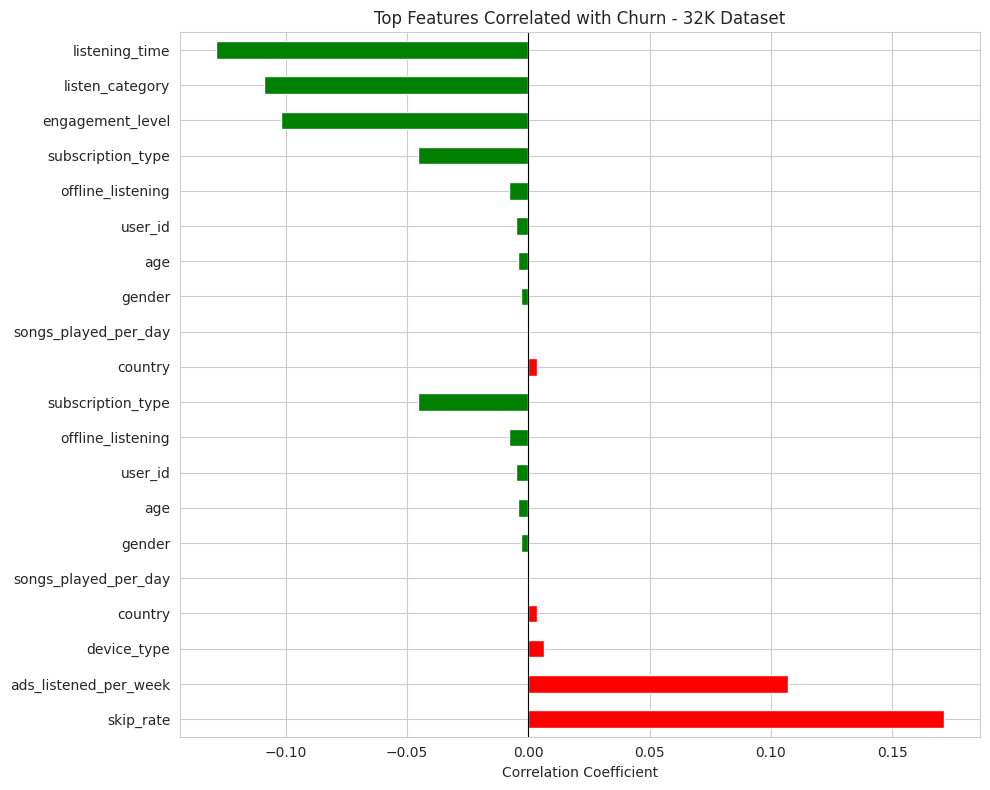


############################################################
# EDA COMPLETE FOR: 32K Dataset
############################################################



In [23]:
complete_eda_suite(spotify_32k, '32K Dataset')